<div class="alert alert-block alert-info">
<h1> Analyse MTBLS19 peak table</h1>
<h3>Link to dataset in Metabolights <a href="https://www.ebi.ac.uk/metabolights/MTBLS19/">here</a>.</h3>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
  - [Below are all the peak tables each batch of the MLBLS19 dataset](#Below-are-all-the-peak-tables-each-batch-of-the-MLBLS19-dataset)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with 1's](#a---Impute-intensities-with-1's)
  - [b - Impute intensities with half minimum value in features](#b---Impute-intensities-with-half-minimum-value-in-features)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import os
import cimcb_lite as cb

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

python_version = ! python --version
print(f'Python version : {python_version[0]}')

Working directory : /home/jovyan/work/
Python version : Python 3.10.4


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

# 0 - Import data

## Below are all the peak tables each batch of the MLBLS19 dataset

In [5]:
for file in os.listdir(pwd + 'data/MTBLS19/peak_tables'):
    
    print(file)
    df = pd.read_excel(pwd + 'data/MTBLS19/peak_tables/Exp1F_POS.xlsx')
    print(f'Shape : {df.shape}')
    
    print()

Exp1F_NEG.xlsx
Shape : (1527, 48)

Exp1F_POS.xlsx
Shape : (1527, 48)

Exp1R_NEG.xlsx
Shape : (1527, 48)

Exp1R_POS.xlsx
Shape : (1527, 48)

Exp2F_NEG.xlsx
Shape : (1527, 48)

Exp2F_POS.xlsx
Shape : (1527, 48)

Exp2R_NEG.xlsx
Shape : (1527, 48)

Exp2R_POS.xlsx
Shape : (1527, 48)



In [6]:
peakTable_MTBLS19_init = pd.read_excel(pwd + 'data/MTBLS19/peak_tables/Exp1F_NEG.xlsx')
print(f'Peak table shape : {peakTable_MTBLS19_init.shape}')
peakTable_MTBLS19_init.head()

Peak table shape : (884, 48)


,Unnamed: 0,mz,rt,Exp1F_CRR_1_NEG,Exp1F_CRR_2_NEG,Exp1F_CRR_3_NEG,Exp1F_CRR_4_NEG,Exp1F_CRR_5_NEG,Exp1F_CRR_6_NEG,Exp1F_CRR_7_NEG,...,Exp1F_HCC_11_NEG,Exp1F_HCC_12_NEG,Exp1F_HCC_13_NEG,Exp1F_HCC_14_NEG,Exp1F_HCC_15_NEG,Exp1F_HCC_16_NEG,Exp1F_HCC_17_NEG,Exp1F_HCC_18_NEG,Exp1F_HCC_19_NEG,Exp1F_HCC_20_NEG
0,Class 1_Cirrhosis 2_HCC,NaN,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
1,1,71.049757,110.190997,67.637002,185.726896,75.985937,217.418330,144.698522,133.116376,49.772532,...,443.892255,70.541671,86.103972,113.516247,100.358242,52.583196,55.428900,215.743648,42.735639,142.300966
2,2,77.053839,36.455501,2907.405030,3027.338533,3309.051179,2757.561498,3327.963185,3070.955936,3061.761679,...,2903.445350,3176.901652,3189.342495,3334.406764,3289.270498,3160.705082,3267.149997,2956.724298,2995.099662,3352.012345
3,3,87.007751,30.764000,137.826661,170.213462,156.738865,235.602188,253.154938,165.778702,122.456620,...,114.760718,148.921213,141.846937,206.492423,161.321390,137.469517,219.188842,219.823627,135.283972,204.931207
4,4,88.046440,30.767502,208.096353,181.241533,200.042809,230.029541,213.013543,190.985028,206.484456,...,188.770280,235.153111,182.694898,248.763606,214.287771,222.847347,203.356375,238.081604,207.034135,197.067213


In [7]:
metadata = pd.read_csv(pwd + 'data/MTBLS19/s_MTBLS19.txt', sep='\t')
print(f'Metadata shape : {metadata.shape}')
metadata.head()

Metadata shape : (360, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Factor Value[Batch],Term Source REF.3,Term Accession Number.3,Factor Value[Experiment],Term Source REF.4,Term Accession Number.4
0,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_1_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
1,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_2_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
2,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_3_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
3,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_4_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
4,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_5_POS,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN


### Below we will keep onky useful metadata

# 1 - Preprocess data

In [8]:
from explore_data_functions import *

## a - Transform data to adapt with input requirements

In [9]:
peakTable_MTBLS19 = peakTable_MTBLS19_init.copy()
peakTable_MTBLS19 = peakTable_MTBLS19.drop(0, axis=0)
peakTable_MTBLS19.index = range(peakTable_MTBLS19.shape[0])
peakTable_MTBLS19 = peakTable_MTBLS19.drop(peakTable_MTBLS19.columns[0], axis=1)
peakTable_MTBLS19.head()

,mz,rt,Exp1F_CRR_1_NEG,Exp1F_CRR_2_NEG,Exp1F_CRR_3_NEG,Exp1F_CRR_4_NEG,Exp1F_CRR_5_NEG,Exp1F_CRR_6_NEG,Exp1F_CRR_7_NEG,Exp1F_CRR_8_NEG,...,Exp1F_HCC_11_NEG,Exp1F_HCC_12_NEG,Exp1F_HCC_13_NEG,Exp1F_HCC_14_NEG,Exp1F_HCC_15_NEG,Exp1F_HCC_16_NEG,Exp1F_HCC_17_NEG,Exp1F_HCC_18_NEG,Exp1F_HCC_19_NEG,Exp1F_HCC_20_NEG
0,71.049757,110.190997,67.637002,185.726896,75.985937,217.418330,144.698522,133.116376,49.772532,114.519249,...,443.892255,70.541671,86.103972,113.516247,100.358242,52.583196,55.428900,215.743648,42.735639,142.300966
1,77.053839,36.455501,2907.405030,3027.338533,3309.051179,2757.561498,3327.963185,3070.955936,3061.761679,2892.348983,...,2903.445350,3176.901652,3189.342495,3334.406764,3289.270498,3160.705082,3267.149997,2956.724298,2995.099662,3352.012345
2,87.007751,30.764000,137.826661,170.213462,156.738865,235.602188,253.154938,165.778702,122.456620,158.155792,...,114.760718,148.921213,141.846937,206.492423,161.321390,137.469517,219.188842,219.823627,135.283972,204.931207
3,88.046440,30.767502,208.096353,181.241533,200.042809,230.029541,213.013543,190.985028,206.484456,212.022984,...,188.770280,235.153111,182.694898,248.763606,214.287771,222.847347,203.356375,238.081604,207.034135,197.067213
4,89.022915,30.759001,3503.373944,4581.490199,3438.491380,4245.961634,3978.362446,1948.582363,2409.304528,2833.303804,...,3396.751794,3449.655556,2357.620781,3595.794727,3168.295229,2968.803325,2794.544777,3514.418528,2867.645882,3458.205045


In [10]:
peakTable_MTBLS19.insert(0, '', peakTable_MTBLS19['mz'].astype(str) + '@' + peakTable_MTBLS19['rt'].astype(str))
peakTable_MTBLS19 = peakTable_MTBLS19.drop(['mz', 'rt'], axis=1)
peakTable_MTBLS19 = peakTable_MTBLS19.transpose()
peakTable_MTBLS19.columns = peakTable_MTBLS19.iloc[0, :]
peakTable_MTBLS19 = peakTable_MTBLS19.drop(peakTable_MTBLS19.index[0], axis=0)
peakTable_MTBLS19 = peakTable_MTBLS19.reset_index()
peakTable_MTBLS19 = peakTable_MTBLS19.rename(columns={'index': 'Sample Name'})
peakTable_MTBLS19.index = range(peakTable_MTBLS19.shape[0])
peakTable_MTBLS19

,Sample Name,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,67.637002,2907.40503,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,Exp1F_CRR_2_NEG,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.38484,301.424329,1104.51667,7163.833608,...,181.295244,708.637574,576.25608,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.63439
2,Exp1F_CRR_3_NEG,75.985937,3309.051179,156.738865,200.042809,3438.49138,189.30773,306.878924,1063.130661,7297.637455,...,168.700612,819.83583,675.603482,415.402508,198.91063,236.339653,322.554015,260.843192,171.237293,42.708372
3,Exp1F_CRR_4_NEG,217.41833,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,...,218.454148,636.0902,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,Exp1F_CRR_5_NEG,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,...,165.504593,450.037887,434.6454,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.52247
5,Exp1F_CRR_6_NEG,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.93289,172.418399,213.530745
6,Exp1F_CRR_7_NEG,49.772532,3061.761679,122.45662,206.484456,2409.304528,115.667278,268.189441,1140.68057,7010.164447,...,180.881229,839.8436,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,Exp1F_CRR_8_NEG,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,...,205.518903,694.288747,656.581369,381.558625,154.61057,183.580652,211.071998,189.61794,101.435727,226.420475
8,Exp1F_CRR_9_NEG,111.318853,3143.21833,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,...,135.023759,657.290814,581.827797,367.58404,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,Exp1F_CRR_10_NEG,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.63311,1041.012084,7011.019083,...,156.848868,664.708972,550.466938,349.485731,159.39782,222.221706,287.919782,232.901208,161.624766,138.109442


In [11]:
metadata_subset = metadata[metadata['Sample Name'].isin(peakTable_MTBLS19['Sample Name'])]
print(f'Metadata shape : {metadata_subset.shape}')
metadata_subset.head()

Metadata shape : (45, 18)


,Source Name,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Organism part],Term Source REF.1,Term Accession Number.1,Protocol REF,Sample Name,Factor Value[Disease],Term Source REF.2,Term Accession Number.2,Factor Value[Batch],Term Source REF.3,Term Accession Number.3,Factor Value[Experiment],Term Source REF.4,Term Accession Number.4
180,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_1_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
181,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_2_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
182,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_3_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
183,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_4_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN
184,Human blood serum,Homo sapiens,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,blood serum,BTO,http://purl.obolibrary.org/obo/BTO_0000133,Sample collection,Exp1F_CRR_5_NEG,CRR,NaN,NaN,Batch1,NaN,NaN,Exp1F,NaN,NaN


In [12]:
peakTable = pd.merge(left=metadata_subset[['Sample Name', 'Factor Value[Disease]']].rename(columns={'Factor Value[Disease]': 'Disease'}),
                     right=peakTable_MTBLS19,
                     on='Sample Name')
print(f'Peak table shape : {peakTable.shape}')
peakTable.head()

Peak table shape : (45, 885)


,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.637002,2907.40503,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,Exp1F_CRR_2_NEG,CRR,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.38484,301.424329,1104.51667,...,181.295244,708.637574,576.25608,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.63439
2,Exp1F_CRR_3_NEG,CRR,75.985937,3309.051179,156.738865,200.042809,3438.49138,189.30773,306.878924,1063.130661,...,168.700612,819.83583,675.603482,415.402508,198.91063,236.339653,322.554015,260.843192,171.237293,42.708372
3,Exp1F_CRR_4_NEG,CRR,217.41833,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,...,218.454148,636.0902,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,Exp1F_CRR_5_NEG,CRR,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,...,165.504593,450.037887,434.6454,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.52247


### Separate intensities (in dataframe <code>X</code>) and metadata (in dataframe <code>metadata</code>)

In [13]:
X = peakTable.iloc[:, 2:]
X

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.637002,2907.40503,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,244.585783,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.38484,301.424329,1104.51667,7163.833608,228.481736,...,181.295244,708.637574,576.25608,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.63439
2,75.985937,3309.051179,156.738865,200.042809,3438.49138,189.30773,306.878924,1063.130661,7297.637455,225.352342,...,168.700612,819.83583,675.603482,415.402508,198.91063,236.339653,322.554015,260.843192,171.237293,42.708372
3,217.41833,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,232.579229,...,218.454148,636.0902,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,230.655967,...,165.504593,450.037887,434.6454,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.52247
5,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,206.829678,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.93289,172.418399,213.530745
6,49.772532,3061.761679,122.45662,206.484456,2409.304528,115.667278,268.189441,1140.68057,7010.164447,317.544933,...,180.881229,839.8436,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,359.46409,...,205.518903,694.288747,656.581369,381.558625,154.61057,183.580652,211.071998,189.61794,101.435727,226.420475
8,111.318853,3143.21833,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,238.558156,...,135.023759,657.290814,581.827797,367.58404,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.63311,1041.012084,7011.019083,199.685351,...,156.848868,664.708972,550.466938,349.485731,159.39782,222.221706,287.919782,232.901208,161.624766,138.109442


In [14]:
metadata = peakTable.drop(X.columns, axis=1)
metadata

,Sample Name,Disease
0,Exp1F_CRR_1_NEG,CRR
1,Exp1F_CRR_2_NEG,CRR
2,Exp1F_CRR_3_NEG,CRR
3,Exp1F_CRR_4_NEG,CRR
4,Exp1F_CRR_5_NEG,CRR
5,Exp1F_CRR_6_NEG,CRR
6,Exp1F_CRR_7_NEG,CRR
7,Exp1F_CRR_8_NEG,CRR
8,Exp1F_CRR_9_NEG,CRR
9,Exp1F_CRR_10_NEG,CRR


In [15]:
target = metadata['Disease']

# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
object    885
dtype: int64



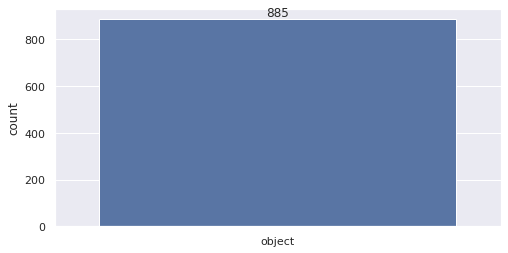

######################################################################################################################################################


In [16]:
plot_feature_types(peakTable)

### For further analysis, we prefer peak table intensites as float

In [17]:
peakTable[peakTable.columns[2:]] = peakTable[peakTable.columns[2:]].apply(pd.to_numeric, errors='coerce', axis=1)
peakTable

,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,Exp1F_CRR_2_NEG,CRR,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,...,181.295244,708.637574,576.256080,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,Exp1F_CRR_3_NEG,CRR,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,...,168.700612,819.835830,675.603482,415.402508,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,Exp1F_CRR_4_NEG,CRR,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,...,218.454148,636.090200,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,Exp1F_CRR_5_NEG,CRR,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,...,165.504593,450.037887,434.645400,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,Exp1F_CRR_6_NEG,CRR,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,Exp1F_CRR_7_NEG,CRR,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,...,180.881229,839.843600,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,Exp1F_CRR_8_NEG,CRR,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,...,205.518903,694.288747,656.581369,381.558625,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,Exp1F_CRR_9_NEG,CRR,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,...,135.023759,657.290814,581.827797,367.584040,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,Exp1F_CRR_10_NEG,CRR,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,...,156.848868,664.708972,550.466938,349.485731,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


######################################################################################################################################################
Data types : 
float64    883
object       2
dtype: int64



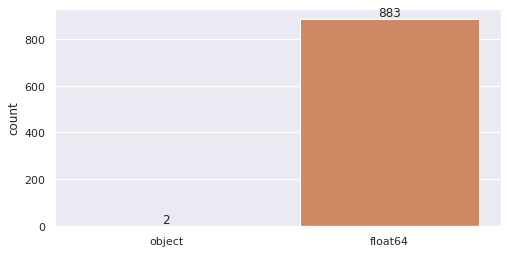

######################################################################################################################################################


In [18]:
plot_feature_types(peakTable)

### Re-subset X to have numerical values instead of object

In [19]:
X = peakTable.iloc[:, 2:]
X

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,244.585783,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,7163.833608,228.481736,...,181.295244,708.637574,576.256080,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,7297.637455,225.352342,...,168.700612,819.835830,675.603482,415.402508,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,232.579229,...,218.454148,636.090200,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,230.655967,...,165.504593,450.037887,434.645400,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,206.829678,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,7010.164447,317.544933,...,180.881229,839.843600,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,359.464090,...,205.518903,694.288747,656.581369,381.558625,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,238.558156,...,135.023759,657.290814,581.827797,367.584040,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,7011.019083,199.685351,...,156.848868,664.708972,550.466938,349.485731,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


## b - Missing values exploration

In [20]:
plot_infos_missing_values(X)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

### The function <code>plot_infos_missing_values</code> was developed to spot values equal to <code>NaN</code> by default. Here there are no NaNs but missing values can be in another form (0, 1, a specific string e.g. *'Unknown'* or *'NA'*, ...). We can pass argument <code>na_values</code> to specify the type of missing values in the peak table.

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 172
- Percent of missing values : 0.43%



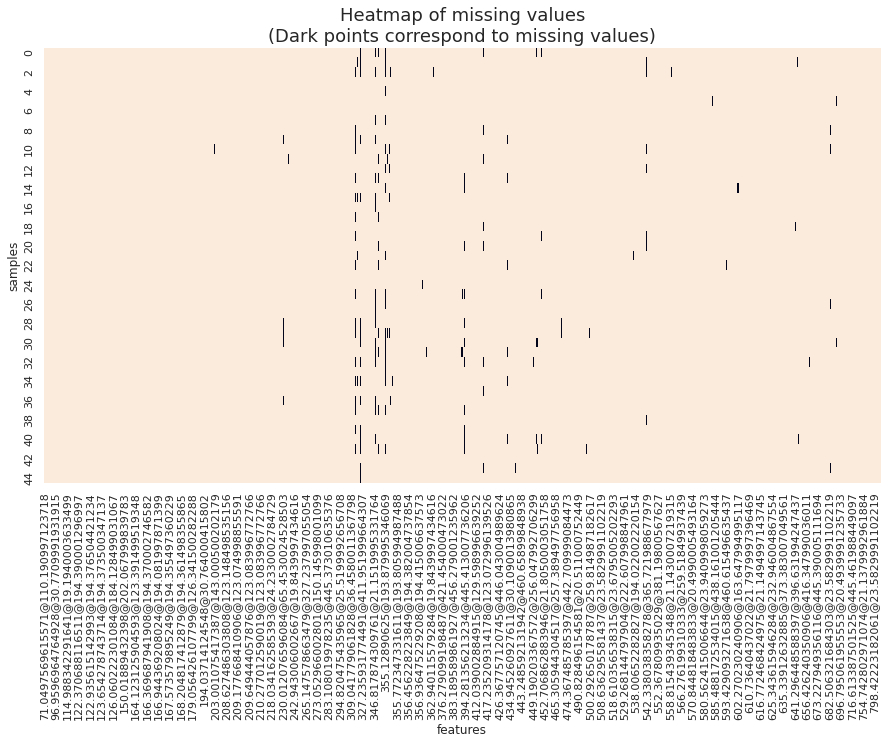

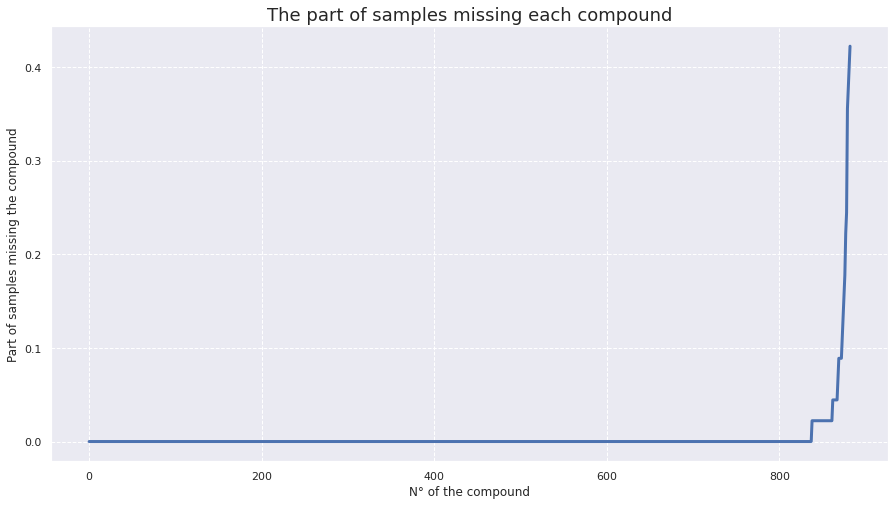



######################################################################################################################################################


In [21]:
plot_infos_missing_values(X, na_values=0)

## c - Correlation between features

######################################################################################################################################################


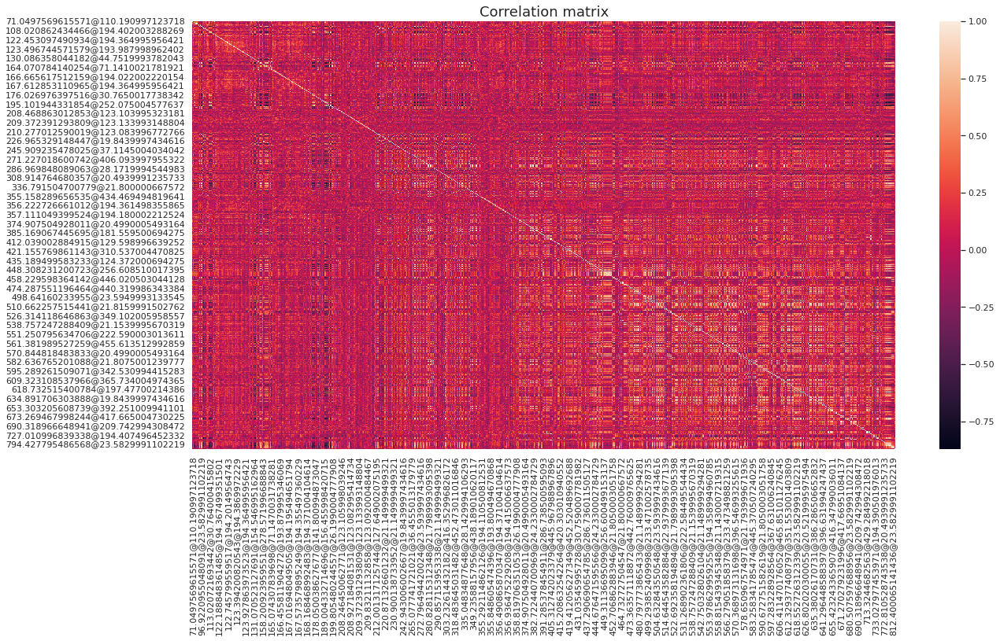

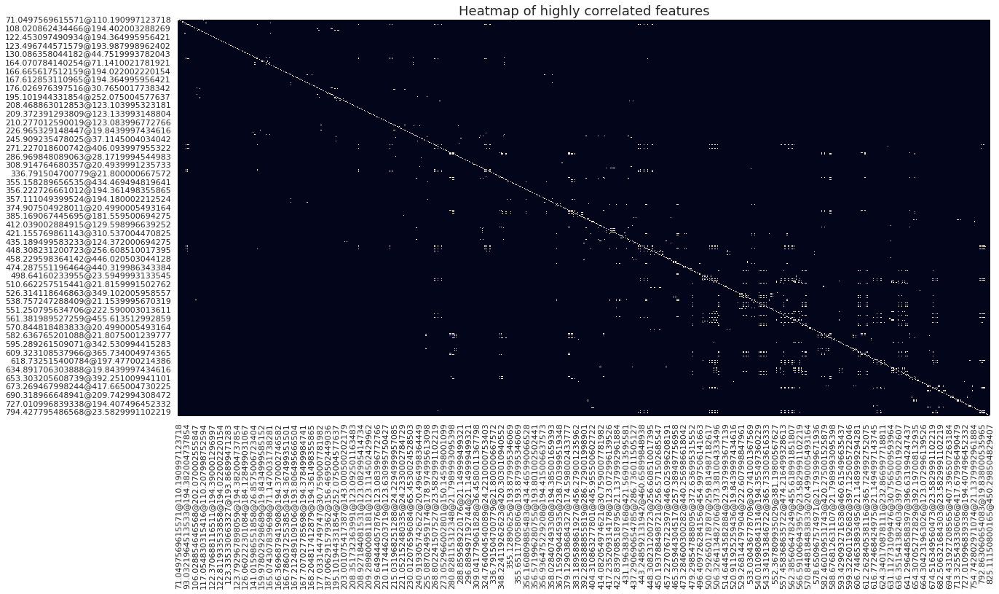



###################################################################################################################################################### 



In [22]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [23]:
X_remove_corr = remove_correlated_features(X)
X_remove_corr

Initial shape : (45, 883)
Final shape : (45, 659)

Time to compute : 00h00m00s

 ######################################################################################################################################################






,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,772.810528743538@20.4939991235733,782.834458017427@20.4705002903938,790.434304209193@23.5829991102219,792.863060654083@19.838000535965,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,244.585783,...,75.480131,108.214575,333.048452,239.843374,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,7163.833608,228.481736,...,50.229256,80.247994,272.557718,181.295244,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,7297.637455,225.352342,...,59.300081,73.378699,232.091727,168.700612,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,232.579229,...,65.736555,66.798539,239.360570,218.454148,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,230.655967,...,60.704917,95.432721,179.958673,165.504593,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,206.829678,...,47.638817,78.368341,227.797705,127.677757,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,7010.164447,317.544933,...,73.490989,87.673333,309.691285,180.881229,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,359.464090,...,56.412655,74.379570,267.916429,205.518903,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,238.558156,...,58.422514,60.229282,256.566652,135.023759,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,7011.019083,199.685351,...,54.660297,80.802960,229.932107,156.848868,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


In [24]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,Sample Name,Disease,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,...,772.810528743538@20.4939991235733,782.834458017427@20.4705002903938,790.434304209193@23.5829991102219,792.863060654083@19.838000535965,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,Exp1F_CRR_1_NEG,CRR,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,...,75.480131,108.214575,333.048452,239.843374,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,Exp1F_CRR_2_NEG,CRR,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,...,50.229256,80.247994,272.557718,181.295244,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,Exp1F_CRR_3_NEG,CRR,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,...,59.300081,73.378699,232.091727,168.700612,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,Exp1F_CRR_4_NEG,CRR,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,...,65.736555,66.798539,239.360570,218.454148,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,Exp1F_CRR_5_NEG,CRR,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,...,60.704917,95.432721,179.958673,165.504593,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,Exp1F_CRR_6_NEG,CRR,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,...,47.638817,78.368341,227.797705,127.677757,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,Exp1F_CRR_7_NEG,CRR,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,...,73.490989,87.673333,309.691285,180.881229,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,Exp1F_CRR_8_NEG,CRR,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,...,56.412655,74.379570,267.916429,205.518903,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,Exp1F_CRR_9_NEG,CRR,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,...,58.422514,60.229282,256.566652,135.023759,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,Exp1F_CRR_10_NEG,CRR,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,...,54.660297,80.802960,229.932107,156.848868,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


## e - PCA

In [26]:
if plot_infos_missing_values(X, plot=False) == 0:
    cb.plot.pca(X, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

Loading BokehJS ...

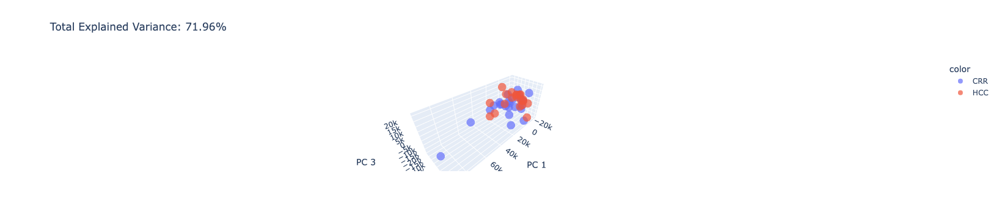

In [27]:
if plot_infos_missing_values(X, plot=False) == 0:
    PCA_3D(X, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

## f - Target visualisation

In [28]:
# target = 

######################################################################################################################################################
Target values : 
CRR    25
HCC    20
Name: Disease, dtype: int64



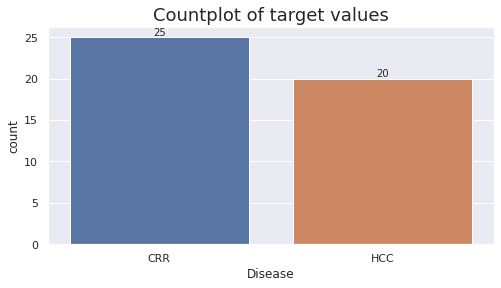

###################################################################################################################################################### 



In [29]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

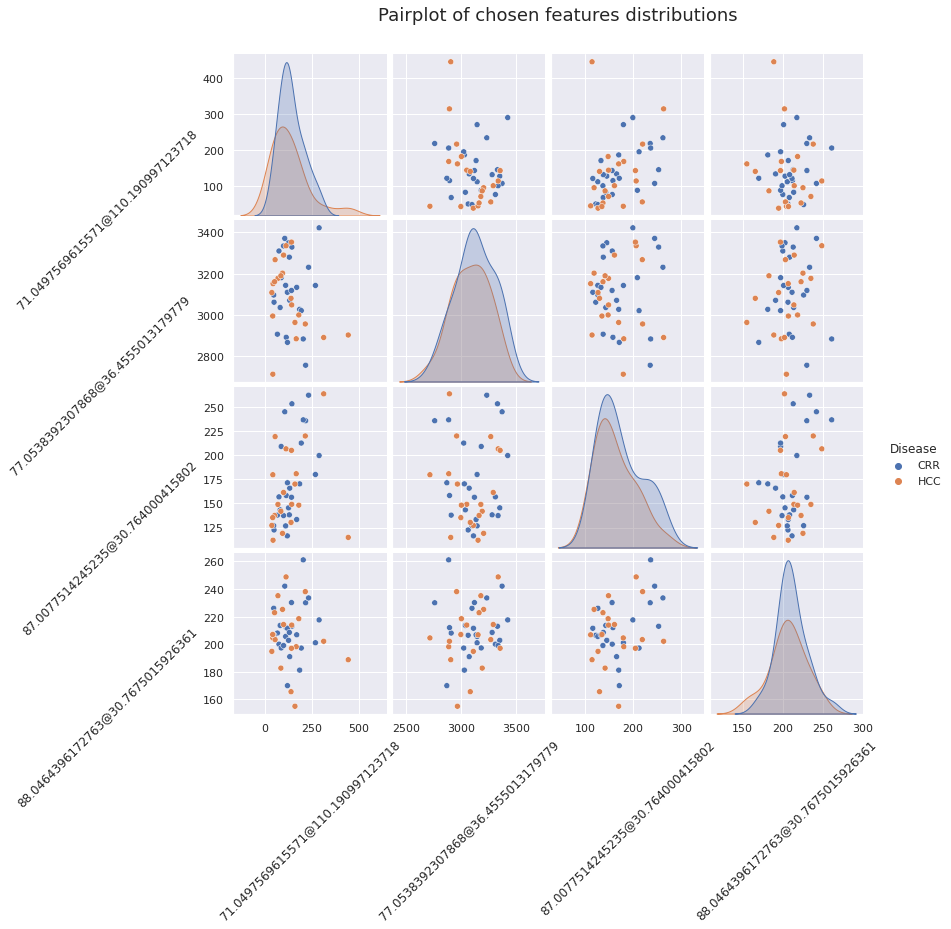

###################################################################################################################################################### 



In [30]:
plot_pairplot_distributions(X, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [31]:
n_features = 3

list_features = random.sample(X.columns.tolist(), n_features)
list_features

['482.795781000895@21.149999499321',
 '666.698036771628@21.1549991369247',
 '512.665172197296@21.800000667572']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

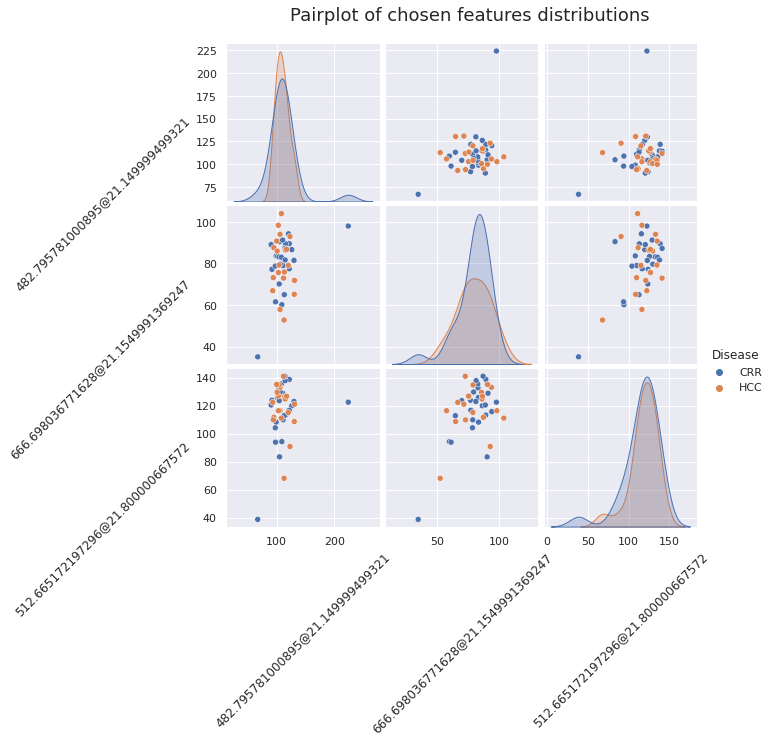

###################################################################################################################################################### 



In [32]:
plot_pairplot_distributions(X, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


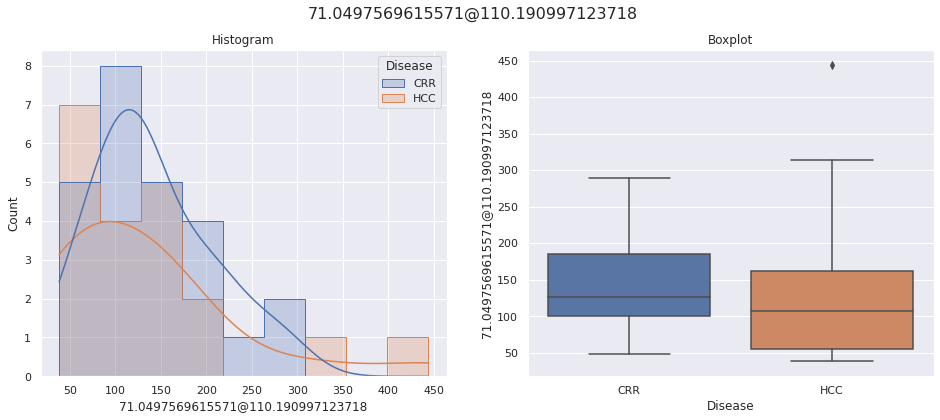

------------------------------------------------------------------------------------------------------------------------


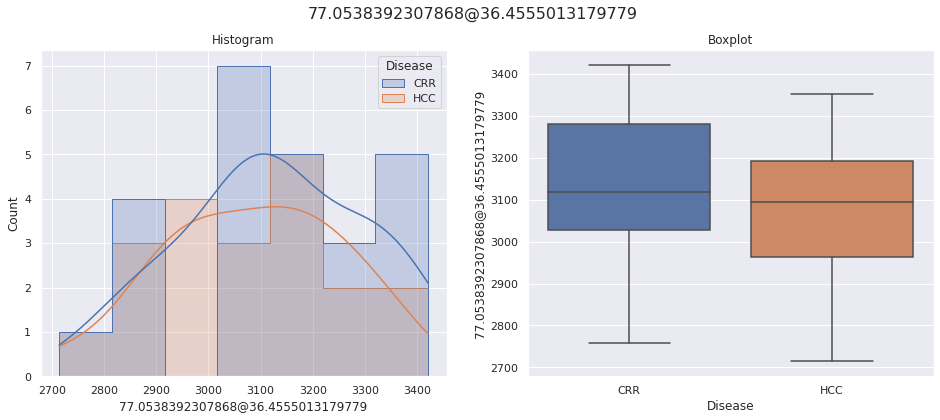

------------------------------------------------------------------------------------------------------------------------


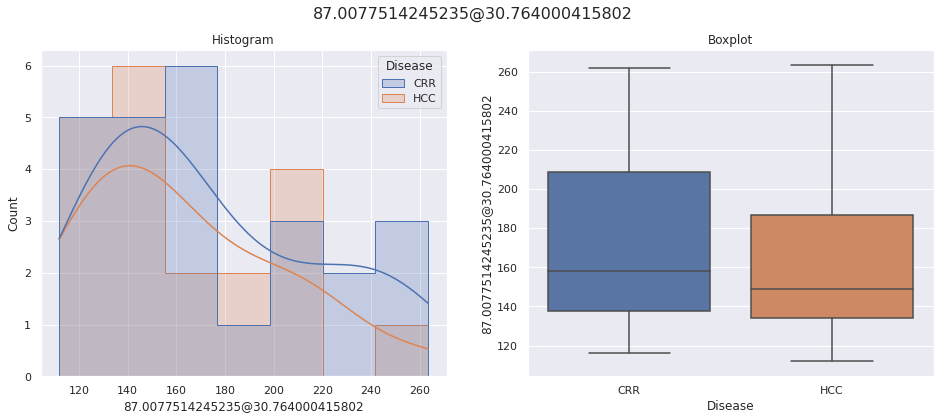

------------------------------------------------------------------------------------------------------------------------


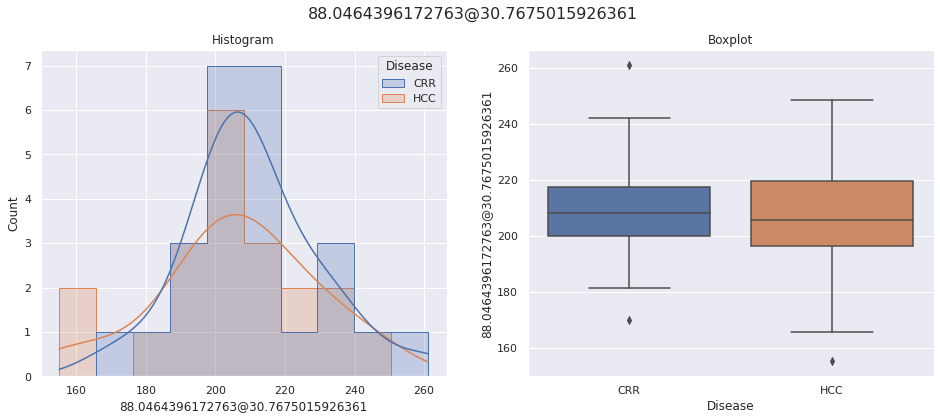

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [33]:
plot_hist_boxplot_distributions(X, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


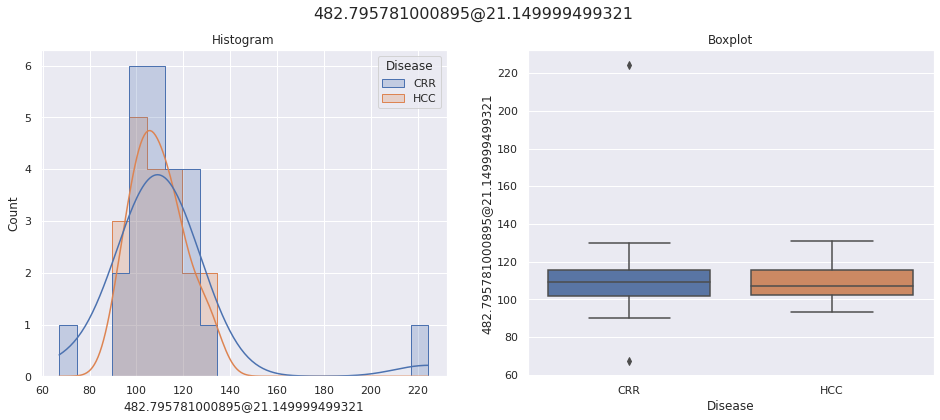

------------------------------------------------------------------------------------------------------------------------


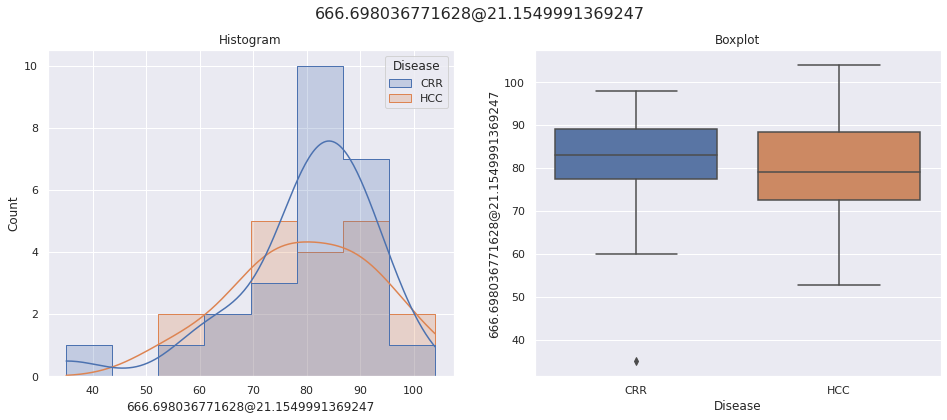

------------------------------------------------------------------------------------------------------------------------


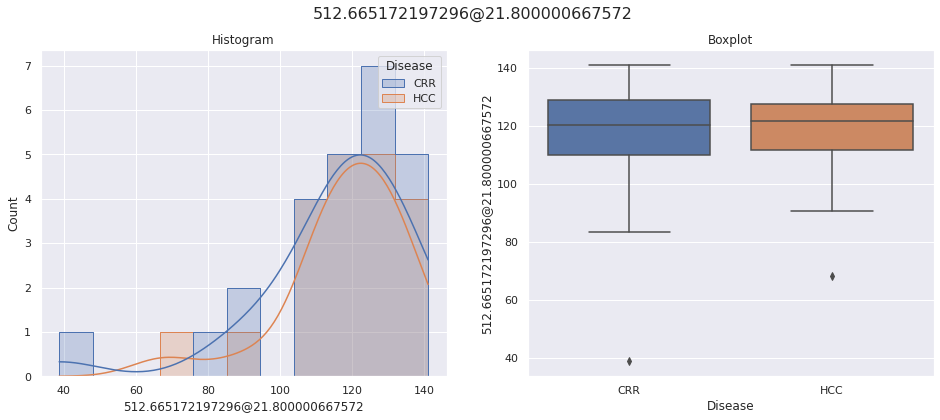

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [34]:
plot_hist_boxplot_distributions(X, target, list_features=list_features)

# 3 - Impute missing values

In [35]:
from missing_value_imputation_functions import *

### We observed before that missing values are here 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 172
- Percent of missing values : 0.43%



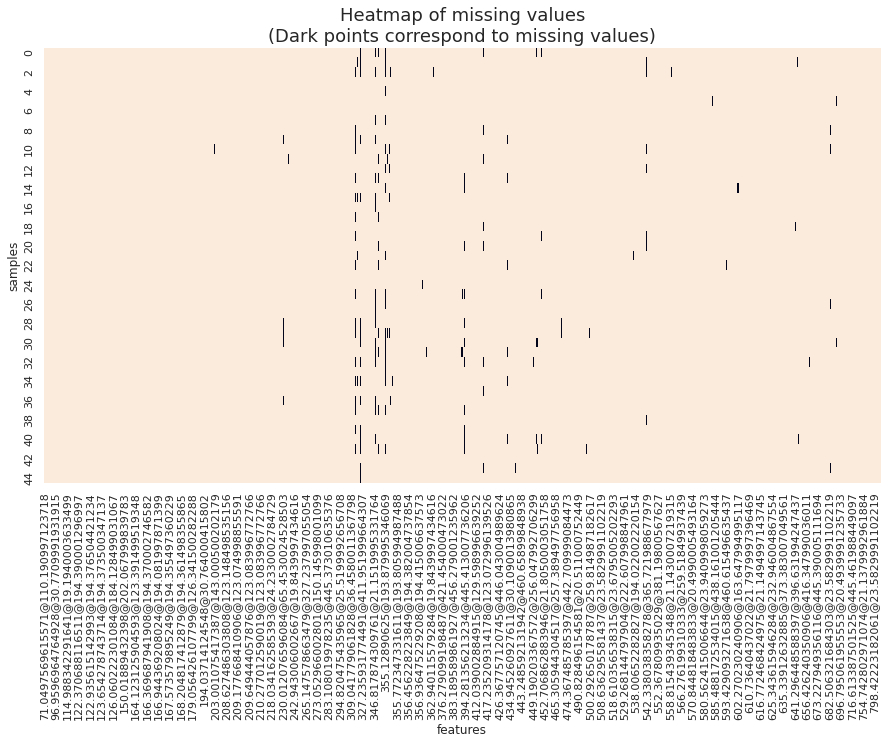

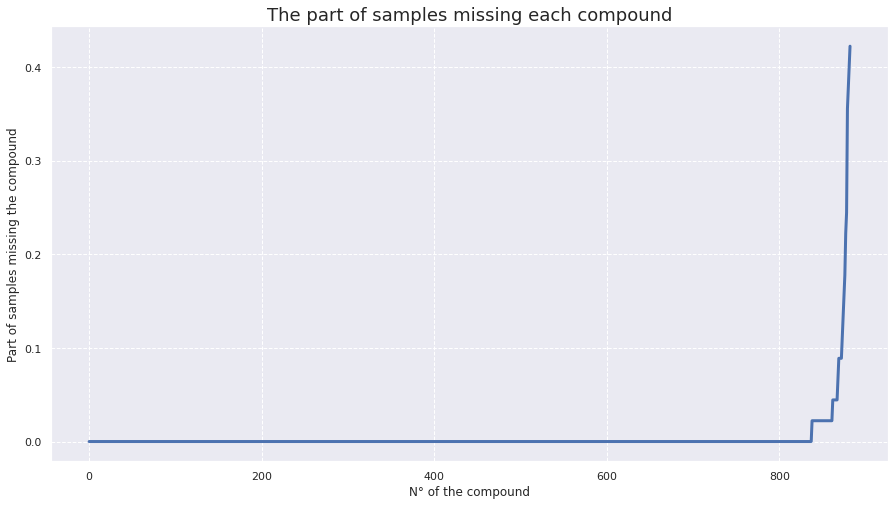



######################################################################################################################################################


In [36]:
plot_infos_missing_values(X, na_values=0)

### Set 0 to NaN to then impute with chosen imputer

In [37]:
X_with_Nan = X.copy()
X_with_Nan[X_with_Nan == 0] = np.nan

## a - Impute intensities with 1's

In [38]:
X_imp_1 = const_imputer(X_with_Nan, 1)
X_imp_1

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,244.585783,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,7163.833608,228.481736,...,181.295244,708.637574,576.256080,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,7297.637455,225.352342,...,168.700612,819.835830,675.603482,415.402508,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,232.579229,...,218.454148,636.090200,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,230.655967,...,165.504593,450.037887,434.645400,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,206.829678,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,7010.164447,317.544933,...,180.881229,839.843600,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,359.464090,...,205.518903,694.288747,656.581369,381.558625,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,238.558156,...,135.023759,657.290814,581.827797,367.584040,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,7011.019083,199.685351,...,156.848868,664.708972,550.466938,349.485731,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


## b - Impute intensities with half minimum value in features

In [39]:
X_imp_halfmin = half_min_imputer(X_with_Nan)
X_imp_halfmin

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,67.637002,2907.405030,137.826661,208.096353,3503.373944,176.112334,131.102001,1105.742169,7158.535864,244.585783,...,239.843374,1015.928453,879.431733,534.482714,214.233771,140.097468,174.083281,172.996535,73.403288,203.827946
1,185.726896,3027.338533,170.213462,181.241533,4581.490199,220.384840,301.424329,1104.516670,7163.833608,228.481736,...,181.295244,708.637574,576.256080,380.229108,171.526575,200.111132,263.926394,248.945301,138.035717,81.634390
2,75.985937,3309.051179,156.738865,200.042809,3438.491380,189.307730,306.878924,1063.130661,7297.637455,225.352342,...,168.700612,819.835830,675.603482,415.402508,198.910630,236.339653,322.554015,260.843192,171.237293,42.708372
3,217.418330,2757.561498,235.602188,230.029541,4245.961634,228.854683,221.659905,1176.566953,6025.427415,232.579229,...,218.454148,636.090200,550.460474,336.461891,139.161695,124.344502,158.966356,128.513661,87.925805,154.891856
4,144.698522,3327.963185,253.154938,213.013543,3978.362446,200.644592,379.730609,1010.089105,6994.522249,230.655967,...,165.504593,450.037887,434.645400,259.543424,113.271737,169.891112,200.578901,214.185795,137.347948,109.522470
5,133.116376,3070.955936,165.778702,190.985028,1948.582363,133.235864,367.876182,996.375533,6829.300734,206.829678,...,127.677757,574.893817,522.928704,330.217691,146.280176,249.994131,293.141943,281.932890,172.418399,213.530745
6,49.772532,3061.761679,122.456620,206.484456,2409.304528,115.667278,268.189441,1140.680570,7010.164447,317.544933,...,180.881229,839.843600,723.737447,434.074861,197.628486,199.346912,272.628777,203.369538,127.883987,116.208887
7,114.519249,2892.348983,158.155792,212.022984,2833.303804,155.996034,293.381937,1098.633601,6623.268325,359.464090,...,205.518903,694.288747,656.581369,381.558625,154.610570,183.580652,211.071998,189.617940,101.435727,226.420475
8,111.318853,3143.218330,126.706529,205.614346,3219.105647,176.466189,362.330543,986.312049,6856.810503,238.558156,...,135.023759,657.290814,581.827797,367.584040,154.962727,194.786677,239.325752,225.840412,132.788358,160.577909
9,121.039869,2867.858448,171.346643,169.984078,3684.234427,205.533316,293.633110,1041.012084,7011.019083,199.685351,...,156.848868,664.708972,550.466938,349.485731,159.397820,222.221706,287.919782,232.901208,161.624766,138.109442


### We can check that there is no more missing values in the imputed peak tables

In [40]:
plot_infos_missing_values(X_imp_1, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

In [41]:
plot_infos_missing_values(X_imp_halfmin, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

# 4 - Transformations

In [42]:
from normalisation_scaling_functions import *

## a - log transformation

In [43]:
#X_imp_halfmin_log = normPeakTable(X_imp_halfmin, 'log10', based='metabolite')
#X_imp_halfmin_log

## b - Standard scale intensities

In [44]:
X_imp_halfmin_std = normPeakTable(X_imp_halfmin, 'autoscaling', based='metabolites')
X_imp_halfmin_std

,71.0497569615571@110.190997123718,77.0538392307868@36.4555013179779,87.0077514245235@30.764000415802,88.0464396172763@30.7675015926361,89.0229154021316@30.7590007781982,90.0263556327561@30.764000415802,91.0025648421499@152.084004878998,92.0257312237893@194.379000663757,92.9278930023734@23.5829991102219,93.0321964513533@194.382004737854,...,792.863060654083@19.838000535965,794.427795486568@23.5829991102219,796.425555159678@23.5829991102219,798.42223182061@23.5829991102219,800.423525656422@23.5829991102219,808.408484559143@23.58049929142,810.403247685268@23.58049929142,812.400065141436@23.5829991102219,814.399494314545@23.5829991102219,825.11150800165@450.298504829407
0,-0.857630,-1.157689,-0.730130,-0.026524,0.302841,-0.193212,-2.043731,0.126900,0.457913,-0.069715,...,1.714324,1.954666,1.946638,1.833710,0.988446,-1.485351,-1.654935,-1.118209,-2.108829,0.843620
1,0.595877,-0.456443,0.026282,-1.330566,2.072116,1.358116,0.155886,0.116674,0.468056,-0.389602,...,0.053500,-0.012707,-0.289265,0.032124,-0.030028,0.282941,0.324403,0.755456,0.245255,-1.120874
2,-0.754867,1.190719,-0.288425,-0.417595,0.196363,0.269161,0.226329,-0.228669,0.724238,-0.451764,...,-0.303770,0.699219,0.443416,0.442927,0.623022,1.350409,1.616031,1.048978,1.454544,-1.746684
3,0.985950,-2.033818,1.553471,1.038529,1.521487,1.654903,-0.874227,0.717893,-1.711549,-0.308211,...,1.107580,-0.477178,-0.479506,-0.479050,-0.801860,-1.949510,-1.987977,-2.215606,-1.579880,0.056879
4,0.090880,1.301297,1.963425,0.212250,1.082335,0.666409,1.167167,-0.671271,0.143890,-0.346414,...,-0.394431,-1.668343,-1.333636,-1.377409,-1.419279,-0.607487,-1.071209,-0.102065,0.220204,-0.672520
5,-0.051678,-0.201413,-0.077295,-0.857432,-2.248697,-1.695623,1.014074,-0.785703,-0.172445,-0.819694,...,-1.467458,-0.868976,-0.682552,-0.551978,-0.632099,1.752735,0.968052,1.569264,1.497563,0.999610
6,-1.077514,-0.255172,-1.089106,-0.104796,-1.492615,-2.311234,-0.273324,0.418442,0.173839,1.379530,...,0.041756,0.827315,0.798402,0.661009,0.592446,0.260424,0.516125,-0.368903,-0.124498,-0.565023
7,-0.280581,-1.245721,-0.255332,0.164149,-0.796798,-0.898096,0.052023,0.067583,-0.566916,2.212203,...,0.740648,-0.104572,0.303129,0.047652,-0.433438,-0.204127,-0.840035,-0.708157,-1.087813,1.206837
8,-0.319973,0.221102,-0.989847,-0.147047,-0.163666,-0.180813,0.942455,-0.869677,-0.119774,-0.189447,...,-1.259075,-0.341445,-0.248174,-0.115562,-0.425040,0.126057,-0.217575,0.185456,0.054132,0.148293
9,-0.200322,-1.388916,0.052748,-1.877216,0.599647,0.837712,0.055266,-0.413236,0.175475,-0.961608,...,-0.639966,-0.293951,-0.479459,-0.326939,-0.319272,0.934426,0.853002,0.359647,1.104430,-0.212930


# 5 - Dimensionality reduction

In [45]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

In [46]:
# target = 

#################################################################################################### 



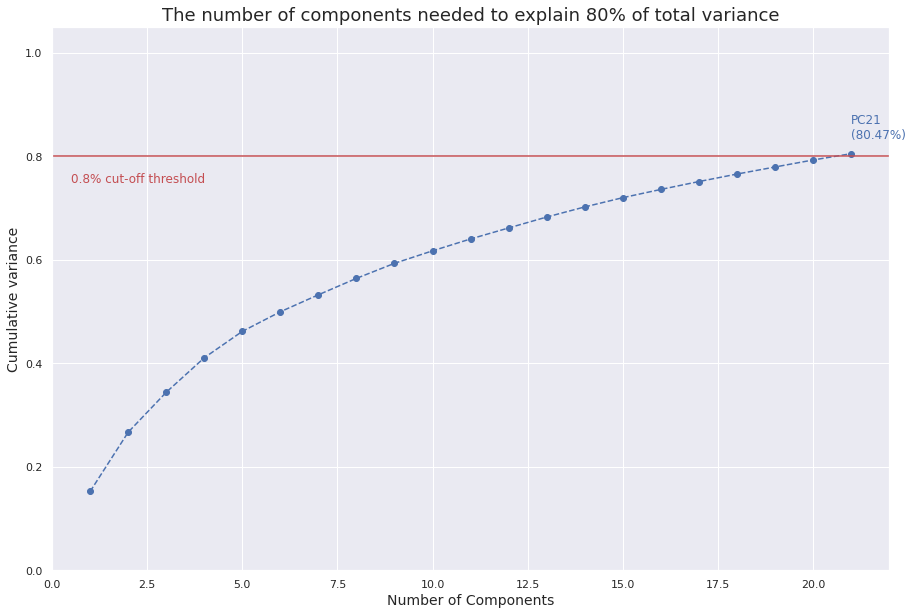

Initial number of dimension : 883
Final number of dimension : 21


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21
0,-14.867730,4.905491,6.430190,1.099787,-4.081390,1.315940,-7.413193,-7.293894,-4.223914,-6.463188,...,5.096233,-5.594778,0.553325,5.654764,-1.259813,-1.643321,-0.839834,-7.910963,3.285834,6.499443
1,1.128534,-2.128130,-5.940741,-4.056996,-4.758391,2.826829,1.527252,-6.849644,4.951596,-5.251305,...,-2.141711,-4.721871,-1.759467,-1.606612,-3.417539,-2.572260,-9.790864,-1.281956,-1.574086,-3.373016
2,0.007695,-15.672177,0.461578,2.621832,7.533213,3.649684,4.835658,-2.109811,6.329560,2.055107,...,1.797971,-2.760048,-2.124438,-5.467033,-1.329706,-1.725230,-0.072433,-2.103462,-0.252245,0.416362
3,5.169369,11.231379,7.776967,-10.661714,15.032733,-6.504202,-11.493475,-12.634355,-1.827548,-0.624645,...,-4.454965,5.989471,11.248519,7.735152,0.627524,1.837585,-1.826629,1.599900,-1.638586,-2.381221
4,7.567570,3.620051,-4.242799,0.463443,-2.447499,2.884824,5.053208,-6.496033,21.810415,-5.245222,...,1.248474,3.356389,2.650485,3.796149,9.077013,-1.377855,2.949748,3.409789,-0.446914,3.746090
5,9.863061,-5.534814,-14.623587,5.145453,-2.368561,-2.520107,-12.989216,0.381082,0.593839,2.970094,...,5.045880,0.211687,1.934824,-6.727741,2.834942,6.471549,-2.220027,1.083131,5.631440,-6.068172
6,-5.960819,-3.071070,4.985920,4.660594,8.311087,3.341489,2.412023,-8.295485,-0.231582,12.406254,...,3.358413,-5.165312,-0.517892,0.378606,1.756540,3.683268,1.725871,-4.806991,1.877427,1.136581
7,1.408762,-2.839040,5.839837,-2.433555,7.178250,-2.927022,-2.279535,-0.430279,-2.451870,1.952011,...,-2.842611,-4.131961,-0.031301,-3.965098,-4.293165,-4.015846,0.419681,-4.038781,0.724788,3.317665
8,-4.258586,4.867441,5.036877,4.335892,-10.082721,-6.555436,1.311485,0.025745,-1.066534,6.984655,...,-0.933865,-3.855472,4.430182,-1.292293,1.420995,4.397800,-0.595656,0.640221,-0.100920,7.579111
9,0.752461,6.625692,-3.394489,6.348853,-0.874994,-3.657391,-7.833424,-3.029603,2.604435,4.965238,...,-5.062533,9.222414,-8.910411,-2.318076,-5.127727,-8.201373,-4.014897,0.146415,0.045322,5.344767



 #################################################################################################### 

Time to compute t-SNE (input dataframe of shape (45, 21)) : 0.17 seconds

----------------------------------------------------------------------------------------------------


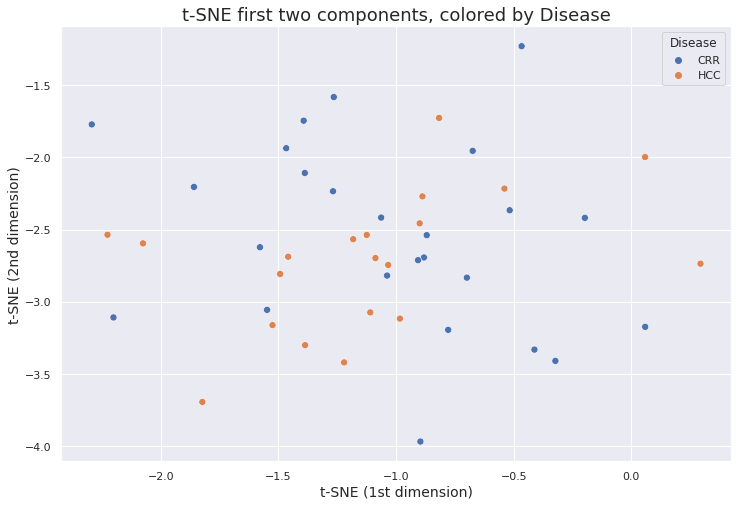

----------------------------------------------------------------------------------------------------


,tSNE1,tSNE2
0,-1.858974,-2.204532
1,-0.699229,-2.833555
2,-0.881693,-2.693633
3,-2.293237,-1.770976
4,-0.896733,-3.970084
5,-1.264836,-1.581217
6,-0.517310,-2.366166
7,-1.063404,-2.416978
8,-1.268027,-2.234628
9,-0.323079,-3.410890


In [47]:
print(100 * '#', '\n')

matrix = X_imp_halfmin_std.copy()

X_imp_halfmin_std_PCA, explained_variance = perform_PCA(matrix, part_explained_variance=0.8, scale_before_PCA=False)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_imp_halfmin_std_PCA)

print('\n', 100 * '#', '\n')

n_components = 2
X_imp_halfmin_std_PCA_tSNE = perform_tSNE(X_imp_halfmin_std_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
display(X_imp_halfmin_std_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

In [48]:
#target = 
matrix = X_imp_halfmin_std.copy()

X_imp_halfmin_std_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_std_fs_anova)

Initial number of dimension : 883
Final number of dimension : 27


,features,f_scores,p_values
485,431.184773860108@310.531497001648,37.749,0.0000
475,421.155769861143@310.537004470825,33.743,0.0000
414,367.159290445935@238.703999519348,14.493,0.0004
830,683.130825852346@417.652988433838,12.251,0.0011
535,459.272444518472@286.726498603821,12.030,0.0012
114,166.665617512159@194.022002220154,11.890,0.0013
441,392.288388855819@286.729001998901,11.608,0.0014
440,391.285378454911@286.738500595093,11.361,0.0016
865,761.613301938878@445.961008071899,11.357,0.0016
495,437.290690654785@286.736011505127,10.742,0.0021


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,367.159290445935@238.703999519348,683.130825852346@417.652988433838,459.272444518472@286.726498603821,166.665617512159@194.022002220154,392.288388855819@286.729001998901,391.285378454911@286.738500595093,761.613301938878@445.961008071899,437.290690654785@286.736011505127,...,655.423243365907@416.347990036011,357.207541790366@245.70499420166,209.603683882135@123.083503246307,403.307137813155@445.934987068176,713.3244682563@429.284992218018,653.304308745973@429.274005889893,297.133947043359@188.573999404907,713.325543330606@417.679996490479,654.307110158458@429.252004623413,405.312742023379@445.967988967896
0,1.043530,1.302446,-0.402699,0.675413,-0.965410,-0.485409,-0.837525,-0.867250,-0.484875,-0.847602,...,0.451765,-0.806000,-0.355232,-0.382442,-0.094941,-0.014180,-0.980835,0.065781,-0.160009,-0.293855
1,0.561681,0.784035,-0.394882,-0.739051,2.366903,1.105559,2.196318,2.116631,-0.664092,1.793761,...,-0.015204,1.018352,-0.334974,-0.640607,0.225837,0.261777,-0.234896,0.352426,0.285748,-0.557273
2,-1.133753,-1.324407,-0.052802,-0.873784,-0.862296,0.601026,-0.790475,-0.846228,0.670484,-0.814505,...,-1.714786,-0.799050,-0.031656,0.372622,-0.916512,-0.948815,-0.299439,-1.006492,-0.965810,0.508495
3,1.405952,1.558089,0.119718,2.656949,0.187032,-0.621785,0.277234,0.117659,-0.081758,0.067439,...,1.601856,1.788510,-0.102265,-0.349682,1.547191,1.780235,-0.585052,1.821942,1.802317,-0.389638
4,0.447794,0.594679,-0.745066,0.368096,-0.253341,0.009271,-0.210907,-0.223084,-0.865026,-0.323260,...,1.848100,0.965761,0.504524,-0.469760,0.766634,0.649923,-0.035302,0.599955,0.678277,-0.587767
5,0.630788,0.990974,-0.627343,0.640996,-0.158686,1.208076,-0.128126,-0.149914,-1.731524,-0.182870,...,0.929498,-0.479380,-0.627258,-1.265481,-0.443571,-0.385525,1.404353,-0.198540,-0.413629,-1.422378
6,0.579620,0.151383,0.010881,0.726894,-0.731442,1.330813,-0.720983,-0.755470,0.433877,-0.728066,...,0.090022,-0.005441,0.410384,0.411146,0.201934,0.237725,-0.437010,0.230404,0.282351,0.560425
7,0.519196,0.444583,-0.437862,0.815270,1.024879,0.516749,0.791429,0.865426,-0.513694,0.776989,...,-0.454237,-0.184796,-1.898215,-0.181397,-0.689681,-0.709305,-0.798940,-0.685412,-0.711407,-0.173871
8,1.052578,1.102861,-0.814156,-0.973462,1.093588,1.816483,0.963398,0.924231,-0.464348,0.899852,...,0.596061,0.439875,-1.350742,-0.393829,0.451621,0.424431,1.092190,0.165470,0.597306,-0.015277
9,0.312193,0.508491,-0.801846,0.635863,-0.385059,-0.299717,-0.400328,-0.290307,0.030557,-0.289930,...,2.517348,-0.339267,0.080495,0.230893,1.543948,1.532980,0.305107,1.150839,1.622255,0.213183


## c - Feature selection keeping a specific number of features

### Keeping 10 features

In [49]:
#target = 
matrix = X_imp_halfmin_std.copy()

X_imp_halfmin_std_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_std_fs_nb_10)

Initial number of dimension : 883
Final number of dimension : 10


,features,f_scores,p_values
485,431.184773860108@310.531497001648,37.749,0.0000
475,421.155769861143@310.537004470825,33.743,0.0000
414,367.159290445935@238.703999519348,14.493,0.0004
830,683.130825852346@417.652988433838,12.251,0.0011
535,459.272444518472@286.726498603821,12.030,0.0012
114,166.665617512159@194.022002220154,11.890,0.0013
441,392.288388855819@286.729001998901,11.608,0.0014
440,391.285378454911@286.738500595093,11.361,0.0016
865,761.613301938878@445.961008071899,11.357,0.0016
495,437.290690654785@286.736011505127,10.742,0.0021


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,367.159290445935@238.703999519348,683.130825852346@417.652988433838,459.272444518472@286.726498603821,166.665617512159@194.022002220154,392.288388855819@286.729001998901,391.285378454911@286.738500595093,761.613301938878@445.961008071899,437.290690654785@286.736011505127
0,1.043530,1.302446,-0.402699,0.675413,-0.965410,-0.485409,-0.837525,-0.867250,-0.484875,-0.847602
1,0.561681,0.784035,-0.394882,-0.739051,2.366903,1.105559,2.196318,2.116631,-0.664092,1.793761
2,-1.133753,-1.324407,-0.052802,-0.873784,-0.862296,0.601026,-0.790475,-0.846228,0.670484,-0.814505
3,1.405952,1.558089,0.119718,2.656949,0.187032,-0.621785,0.277234,0.117659,-0.081758,0.067439
4,0.447794,0.594679,-0.745066,0.368096,-0.253341,0.009271,-0.210907,-0.223084,-0.865026,-0.323260
5,0.630788,0.990974,-0.627343,0.640996,-0.158686,1.208076,-0.128126,-0.149914,-1.731524,-0.182870
6,0.579620,0.151383,0.010881,0.726894,-0.731442,1.330813,-0.720983,-0.755470,0.433877,-0.728066
7,0.519196,0.444583,-0.437862,0.815270,1.024879,0.516749,0.791429,0.865426,-0.513694,0.776989
8,1.052578,1.102861,-0.814156,-0.973462,1.093588,1.816483,0.963398,0.924231,-0.464348,0.899852
9,0.312193,0.508491,-0.801846,0.635863,-0.385059,-0.299717,-0.400328,-0.290307,0.030557,-0.289930


######################################################################################################################################################


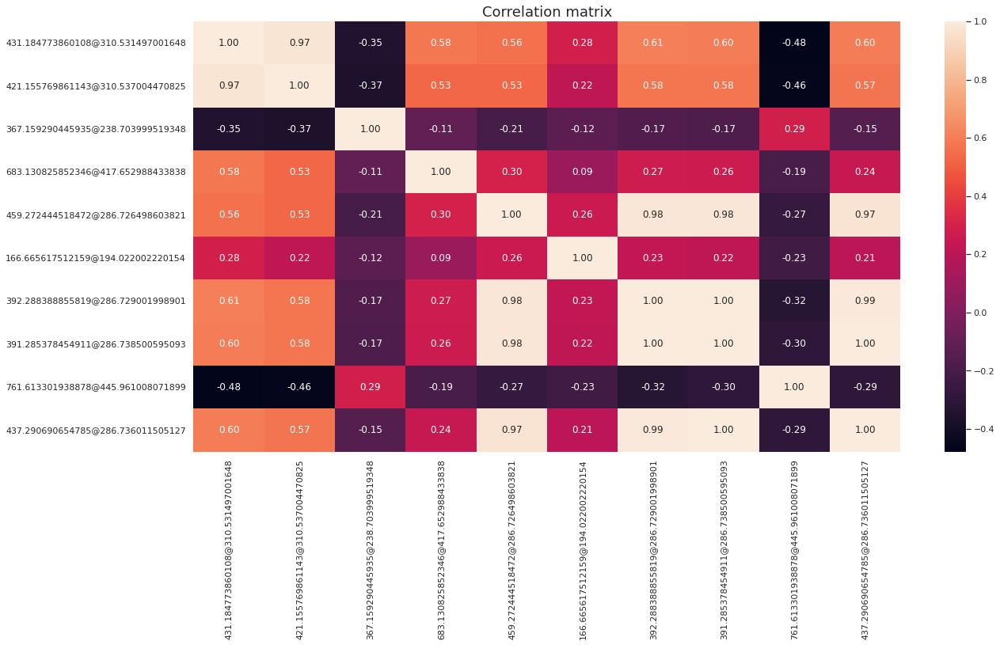

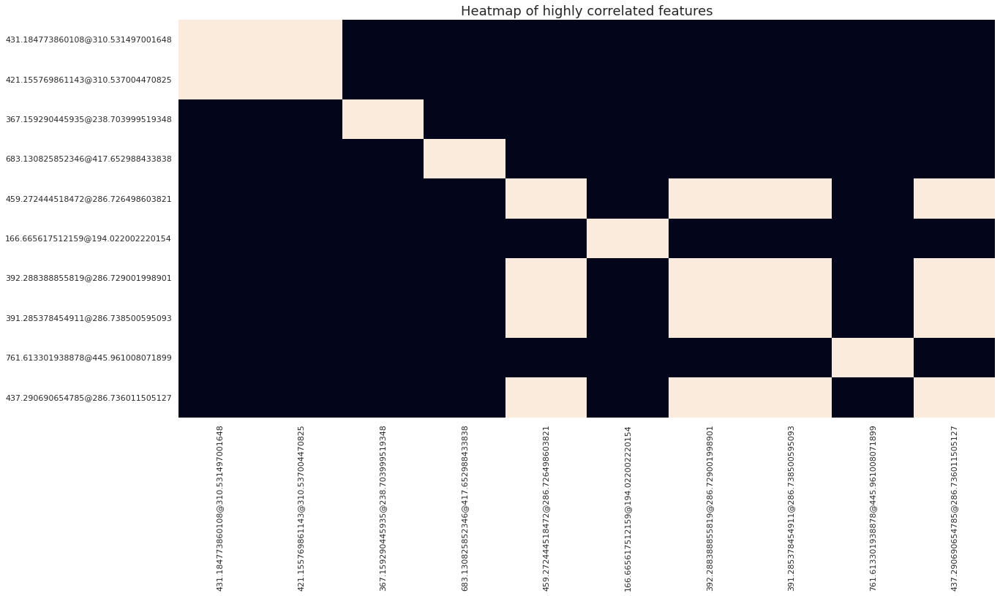



###################################################################################################################################################### 



In [50]:
matrix = pd.concat([target, X_imp_halfmin_std_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 5 features

In [51]:
#target = 
matrix = X_imp_halfmin_std.copy()

X_imp_halfmin_std_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_std_fs_nb_5)

Initial number of dimension : 883
Final number of dimension : 5


,features,f_scores,p_values
485,431.184773860108@310.531497001648,37.749,0.0000
475,421.155769861143@310.537004470825,33.743,0.0000
414,367.159290445935@238.703999519348,14.493,0.0004
830,683.130825852346@417.652988433838,12.251,0.0011
535,459.272444518472@286.726498603821,12.030,0.0012


,431.184773860108@310.531497001648,421.155769861143@310.537004470825,367.159290445935@238.703999519348,683.130825852346@417.652988433838,459.272444518472@286.726498603821
0,1.043530,1.302446,-0.402699,0.675413,-0.965410
1,0.561681,0.784035,-0.394882,-0.739051,2.366903
2,-1.133753,-1.324407,-0.052802,-0.873784,-0.862296
3,1.405952,1.558089,0.119718,2.656949,0.187032
4,0.447794,0.594679,-0.745066,0.368096,-0.253341
5,0.630788,0.990974,-0.627343,0.640996,-0.158686
6,0.579620,0.151383,0.010881,0.726894,-0.731442
7,0.519196,0.444583,-0.437862,0.815270,1.024879
8,1.052578,1.102861,-0.814156,-0.973462,1.093588
9,0.312193,0.508491,-0.801846,0.635863,-0.385059


######################################################################################################################################################


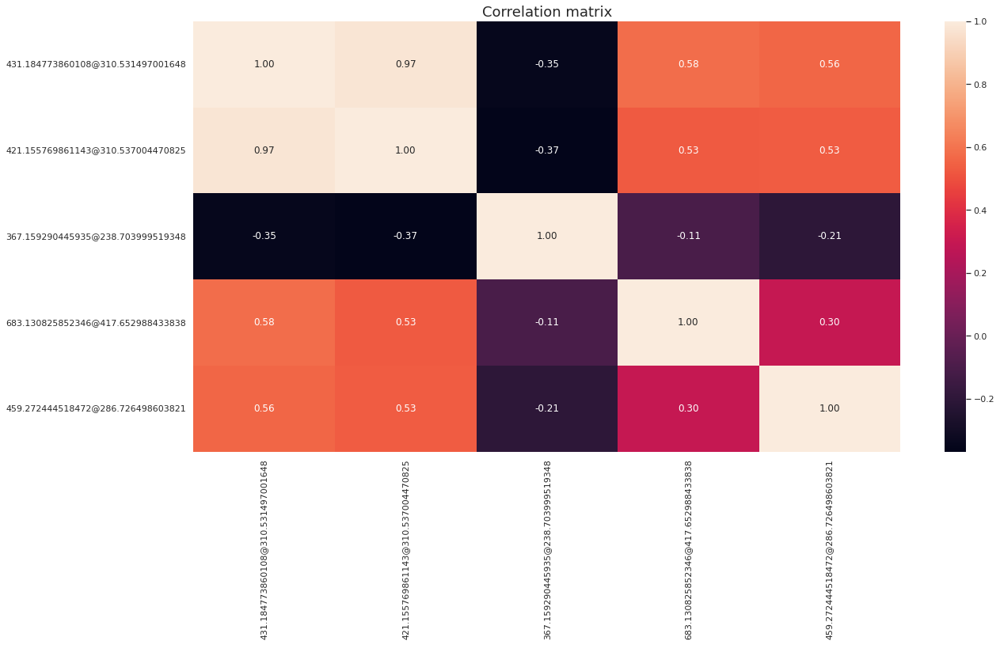

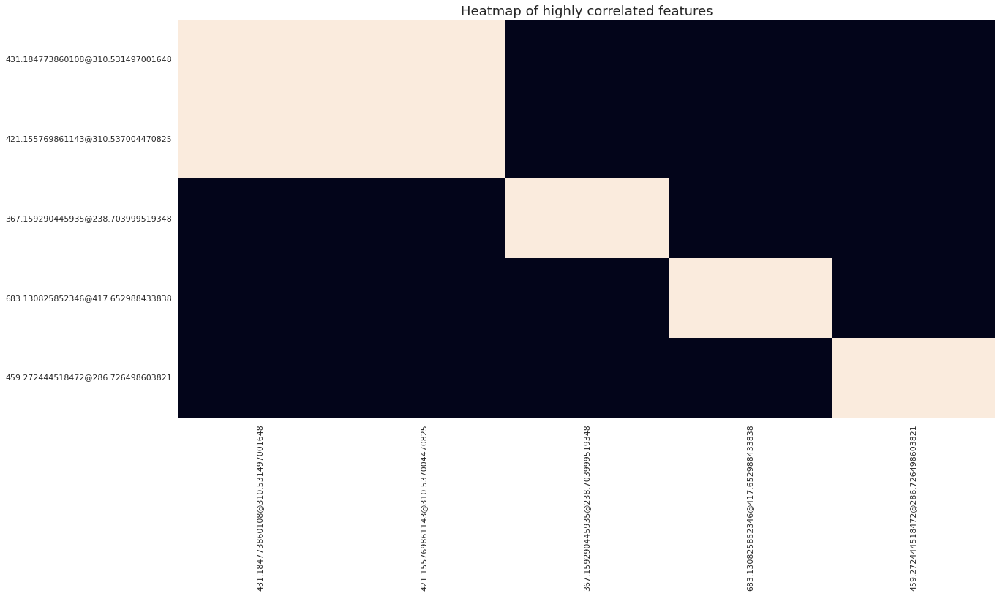



###################################################################################################################################################### 



In [52]:
matrix = pd.concat([target, X_imp_halfmin_std_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.8, annot=True, fmt='.2f')

### Keeping 1 feature

In [53]:
#target = 
matrix = X_imp_halfmin_std.copy()

X_imp_halfmin_std_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_imp_halfmin_std_fs_nb_1)

Initial number of dimension : 883
Final number of dimension : 1


,features,f_scores,p_values
485,431.184773860108@310.531497001648,37.749,0.0


,431.184773860108@310.531497001648
0,1.043530
1,0.561681
2,-1.133753
3,1.405952
4,0.447794
5,0.630788
6,0.579620
7,0.519196
8,1.052578
9,0.312193


#### For further analysis, we have the following reduced dataframes :
- <code>X_imp_halfmin_std_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_imp_halfmin_std_PCA_tSNE</code> : reduced peak table with PCA as before + t-SNE reduction to keep only 2 components
- <code>X_imp_halfmin_std_fs_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>X_imp_halfmin_std_fs_nb_N</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [54]:
from classification_functions import *

In [55]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import LeaveOneOut

## a - Launch pipeline with differently preprocessed dataframes

In [56]:
# target = 

### with <code>X_imp_halfmin_std_PCA</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


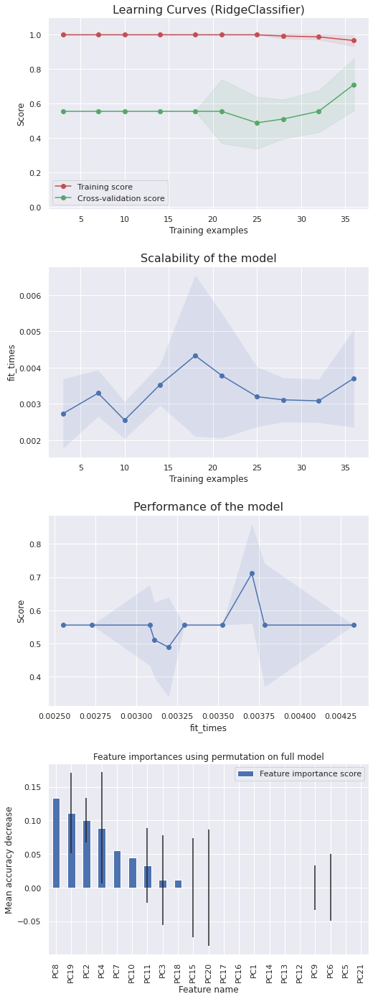




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


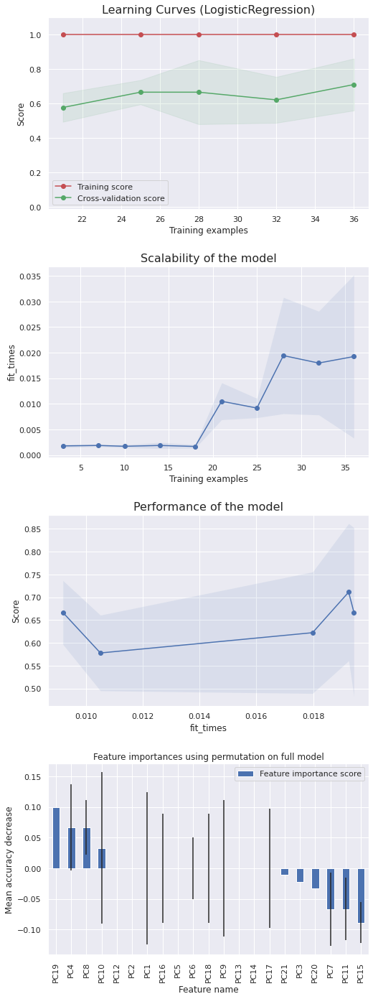




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


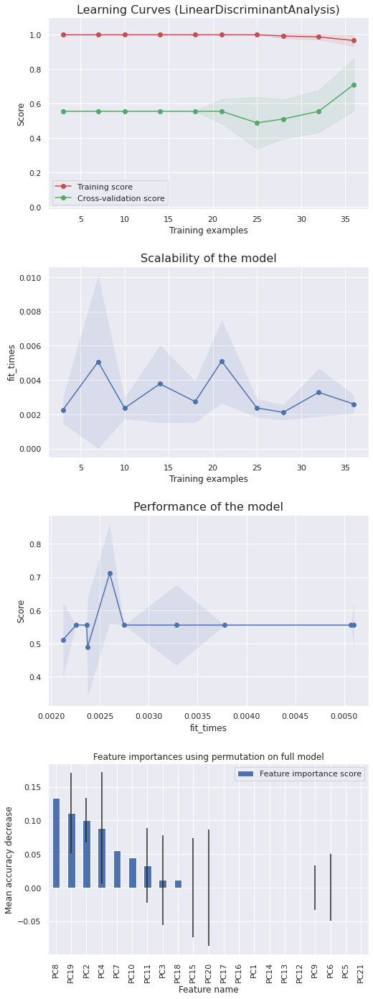




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


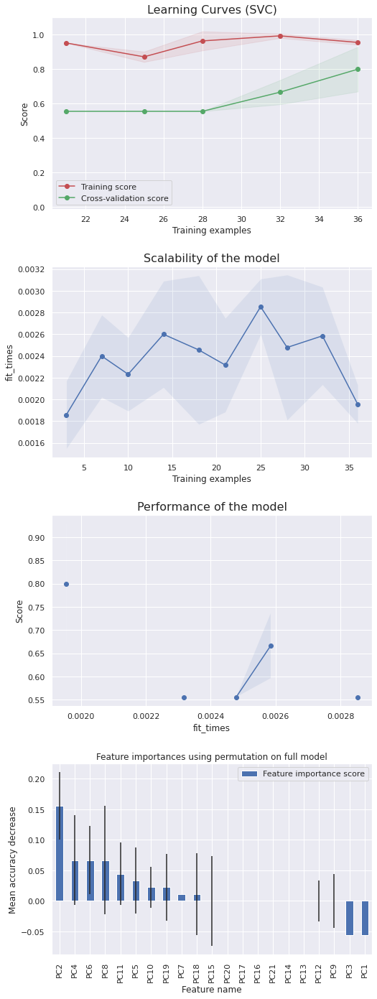




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.75,0.60,0.67,5.00
HCC,0.60,0.75,0.67,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.68,0.68,0.67,9.00
weighted avg,0.68,0.67,0.67,9.00


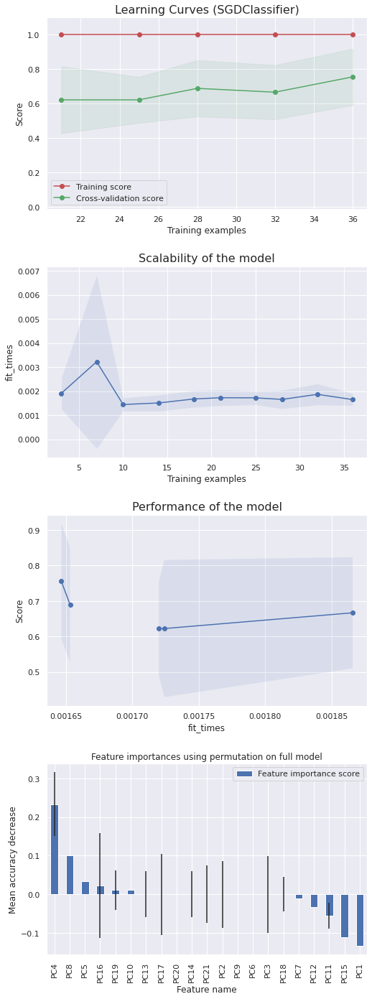




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 429, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 666, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_classification.py", line 219, in predict
    neigh_ind = self.kneighbors(X, return_distance=False)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_base.py", line 749, in kneighbors
    raise ValueError(
Val

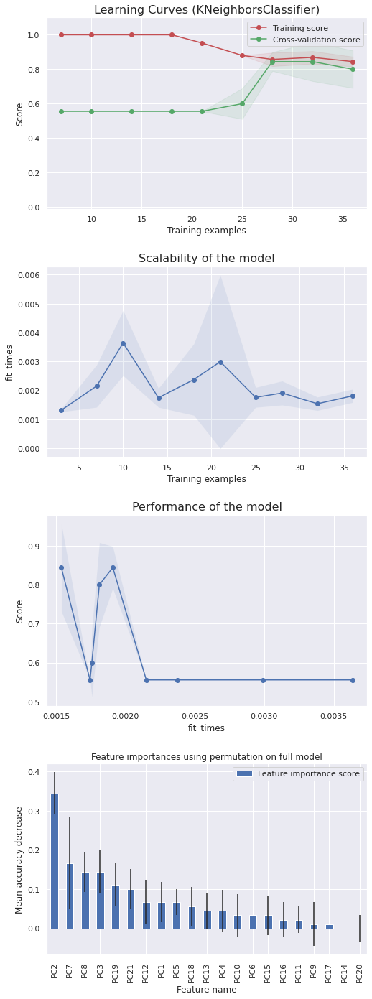




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.80,0.73,5.00
HCC,0.67,0.50,0.57,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.67,0.65,0.65,9.00
weighted avg,0.67,0.67,0.66,9.00


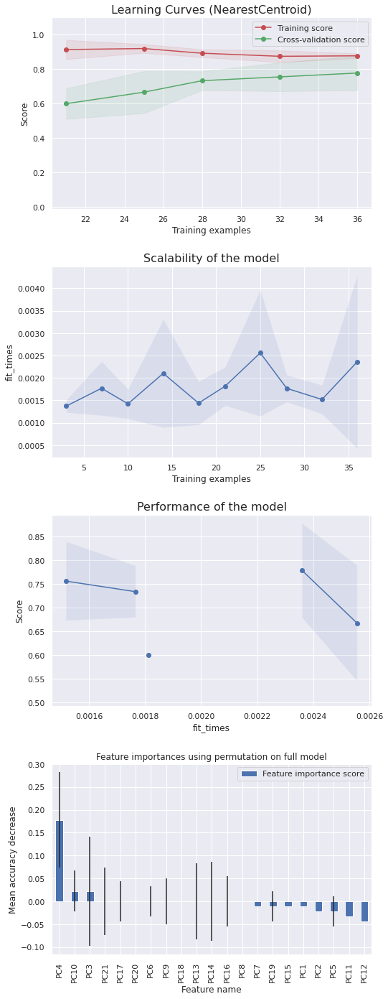




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


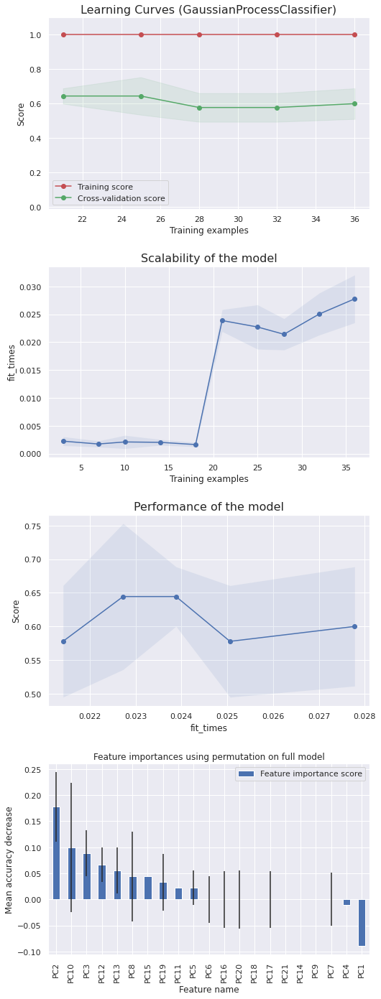




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.60,0.60,0.60,5.00
HCC,0.50,0.50,0.50,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.55,0.55,0.55,9.00
weighted avg,0.56,0.56,0.56,9.00


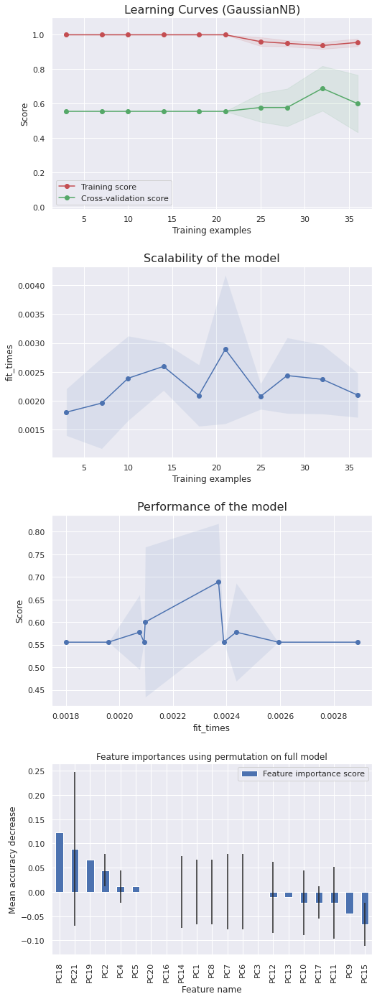




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.60,0.60,0.60,5.00
HCC,0.50,0.50,0.50,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.55,0.55,0.55,9.00
weighted avg,0.56,0.56,0.56,9.00


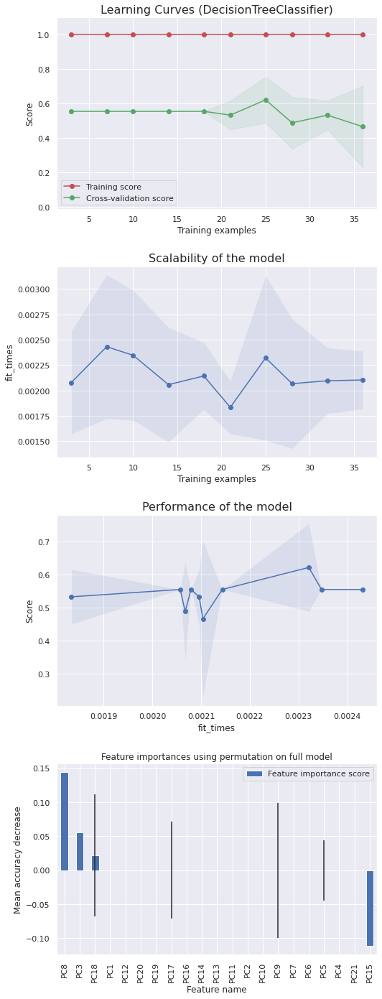




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.67,0.80,0.73,5.00
HCC,0.67,0.50,0.57,4.00
accuracy,0.67,0.67,0.67,0.67
macro avg,0.67,0.65,0.65,9.00
weighted avg,0.67,0.67,0.66,9.00


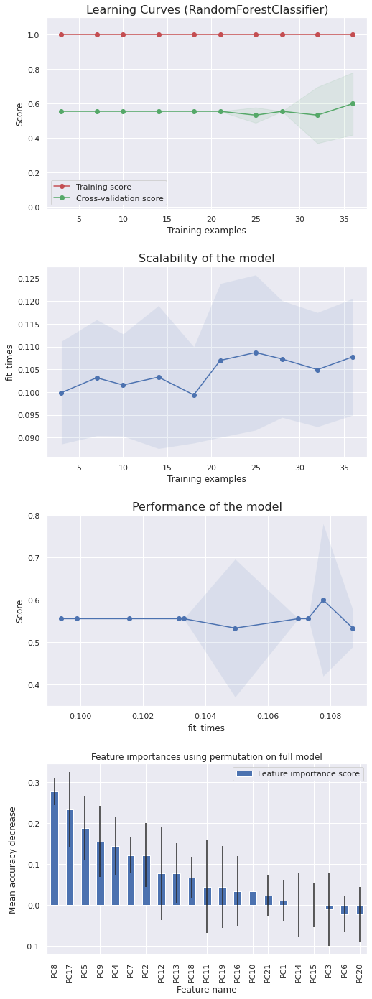




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.71,1.00,0.83,5.00
HCC,1.00,0.50,0.67,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.86,0.75,0.75,9.00
weighted avg,0.84,0.78,0.76,9.00


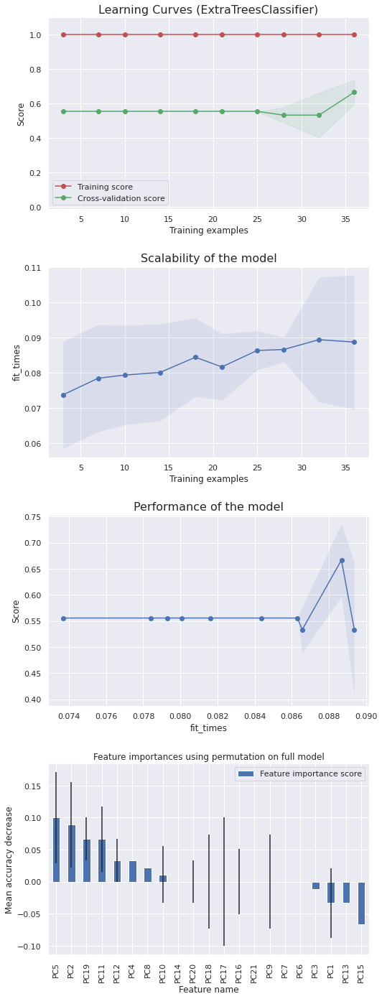




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,1,4
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.33,0.20,0.25,5.00
HCC,0.33,0.50,0.40,4.00
accuracy,0.33,0.33,0.33,0.33
macro avg,0.33,0.35,0.33,9.00
weighted avg,0.33,0.33,0.32,9.00


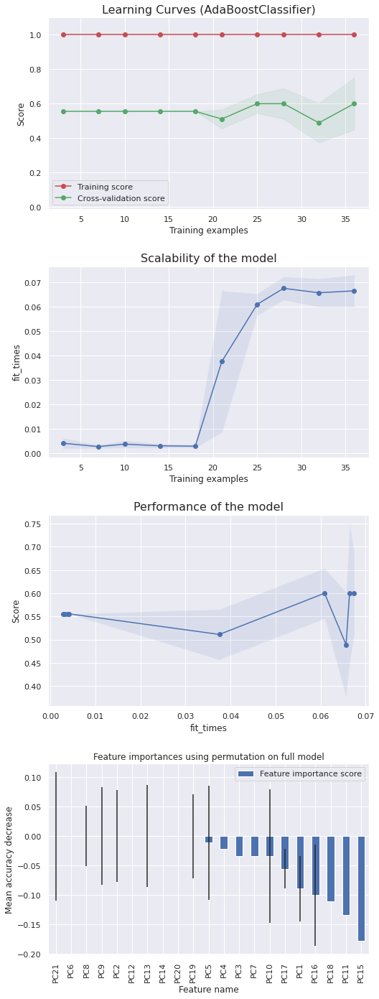




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,3,2
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.60,0.60,0.60,5.00
HCC,0.50,0.50,0.50,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.55,0.55,0.55,9.00
weighted avg,0.56,0.56,0.56,9.00


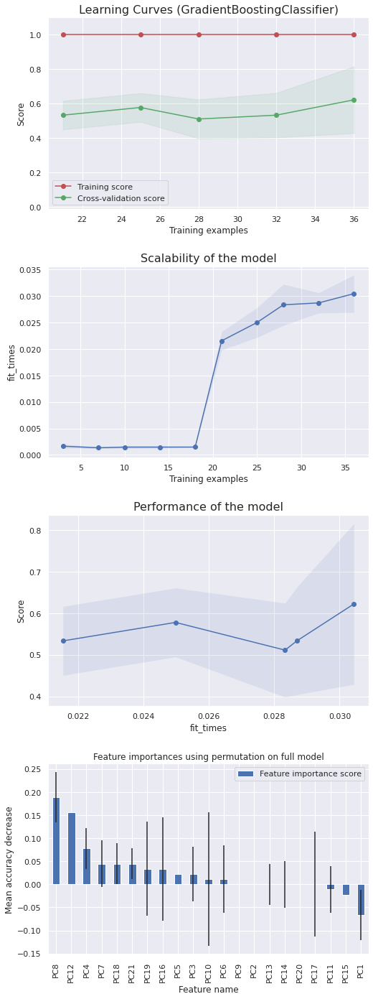




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,4,0



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CRR,0.56,1.00,0.71,5.00
HCC,0.00,0.00,0.00,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.28,0.50,0.36,9.00
weighted avg,0.31,0.56,0.40,9.00


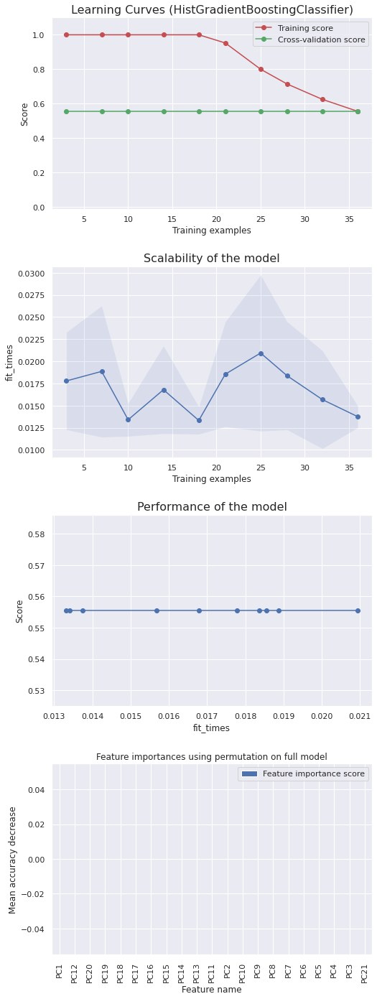




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,3,1



Classification report :


,precision,recall,f1-score,support
CRR,0.57,0.80,0.67,5.00
HCC,0.50,0.25,0.33,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.54,0.53,0.50,9.00
weighted avg,0.54,0.56,0.52,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


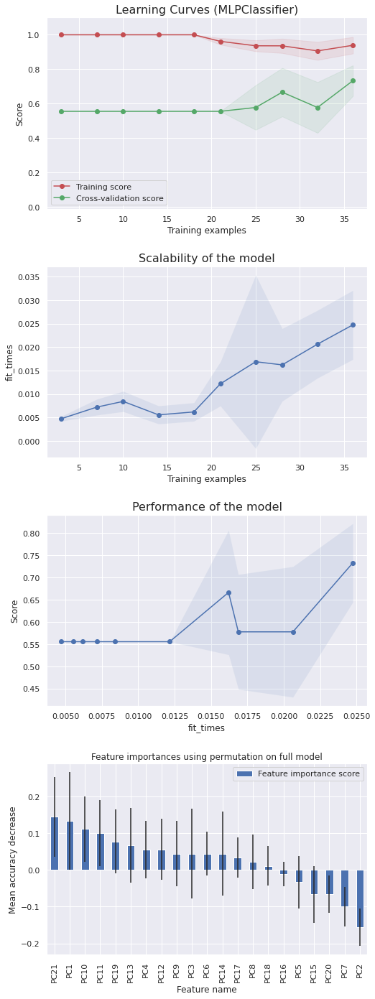




###################################################################################################################################################### 



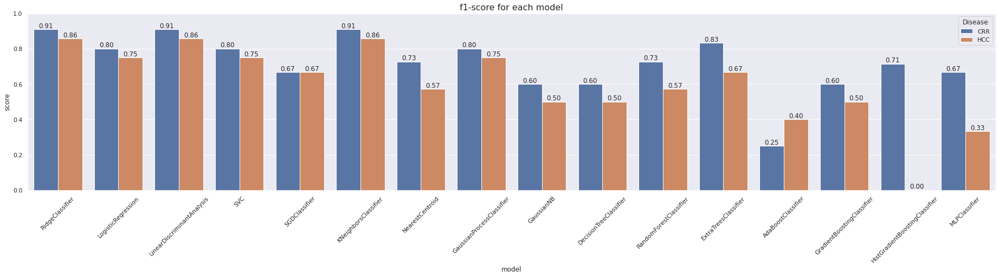


 ######################################################################################################################################################

Time to compute : 00h00m30s

 ######################################################################################################################################################






In [57]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_std_PCA, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=5, train_size=0.7, test_size=0.3)

In [58]:
print()

### with <code>X_imp_halfmin_std_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


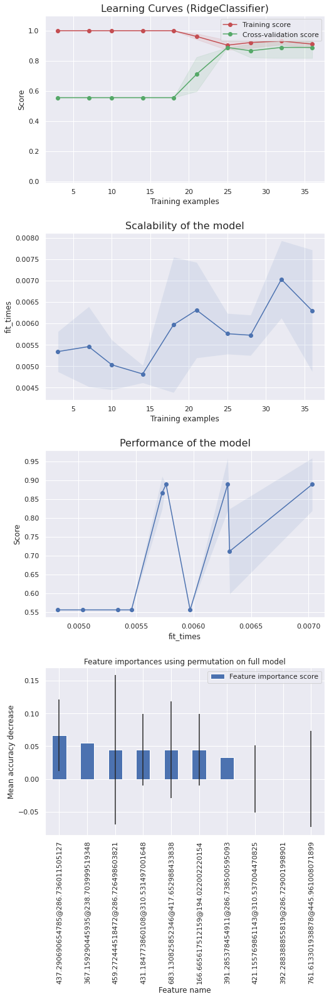




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


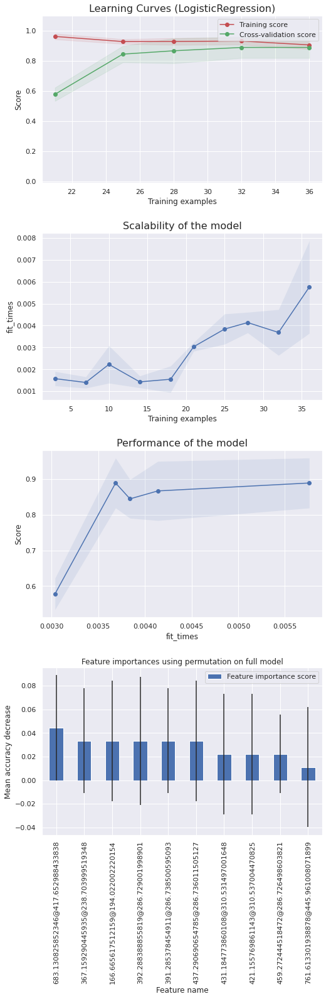




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


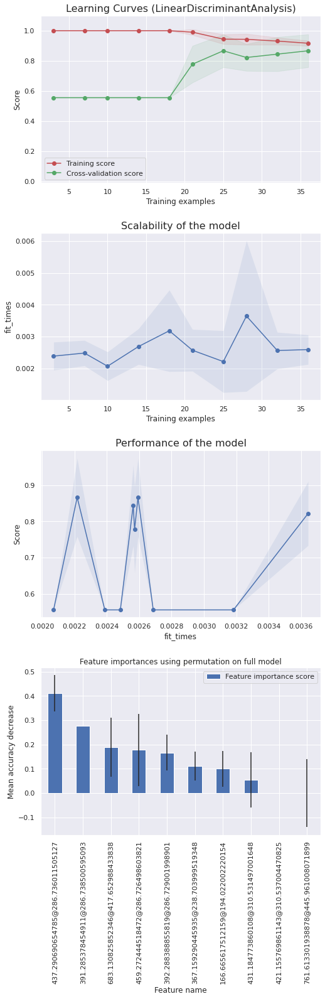




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


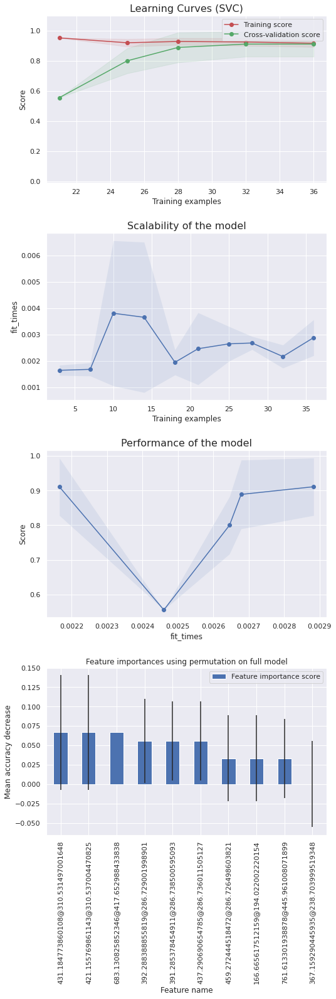




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


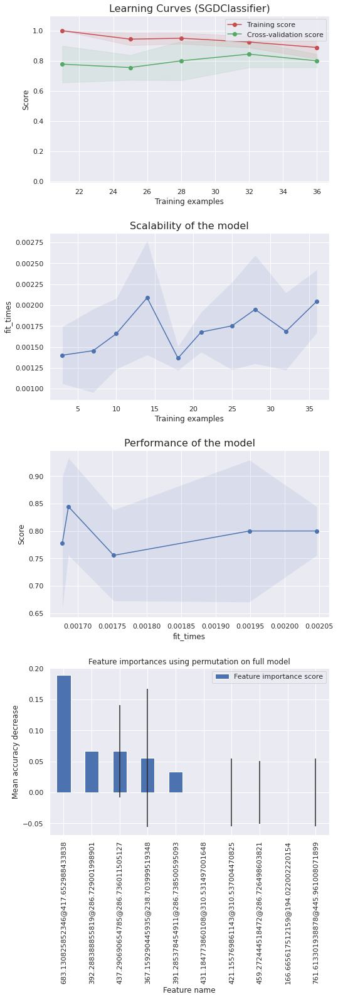




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 429, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 666, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_classification.py", line 219, in predict
    neigh_ind = self.kneighbors(X, return_distance=False)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/neighbors/_base.py", line 749, in kneighbors
    raise ValueError(
Val

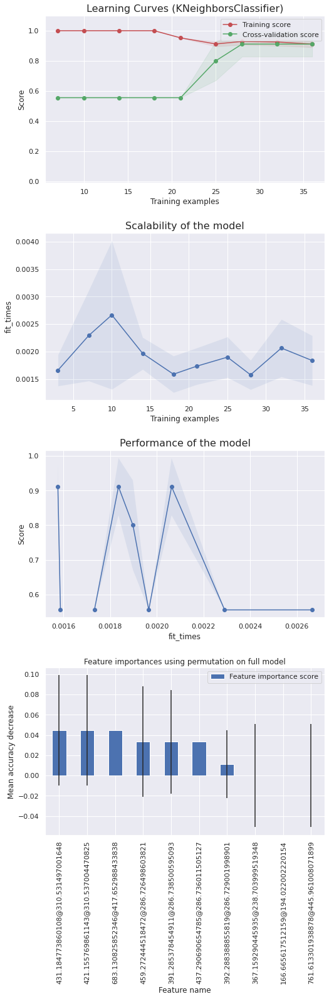




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


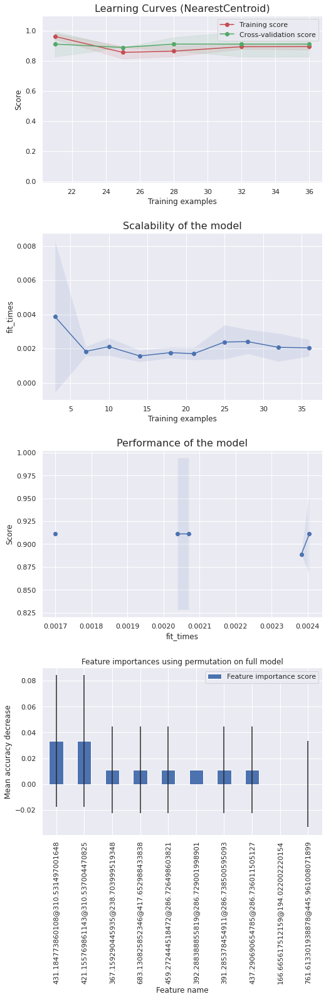




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


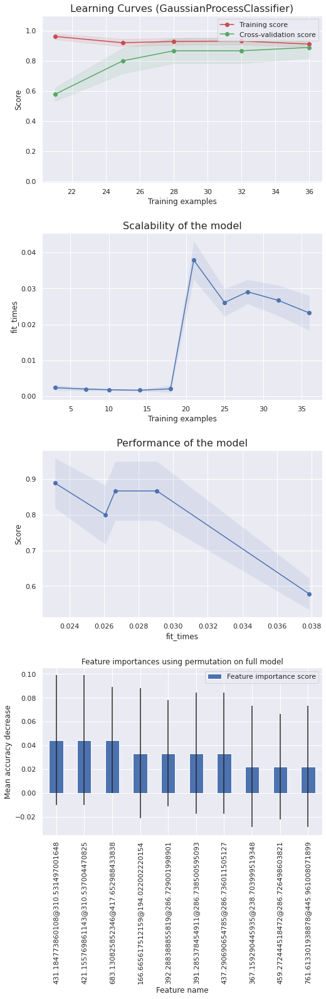




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


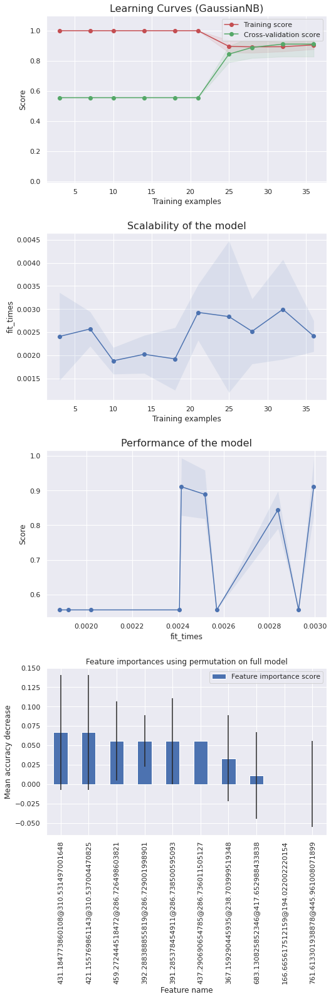




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


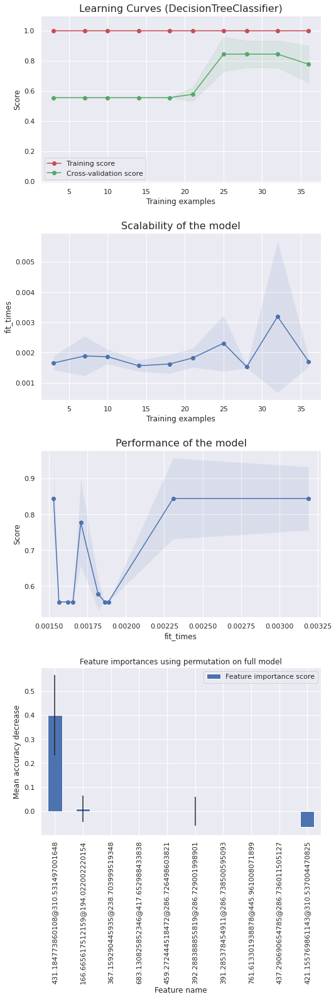




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,2,2



Classification report :


,precision,recall,f1-score,support
CRR,0.71,1.00,0.83,5.00
HCC,1.00,0.50,0.67,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.86,0.75,0.75,9.00
weighted avg,0.84,0.78,0.76,9.00


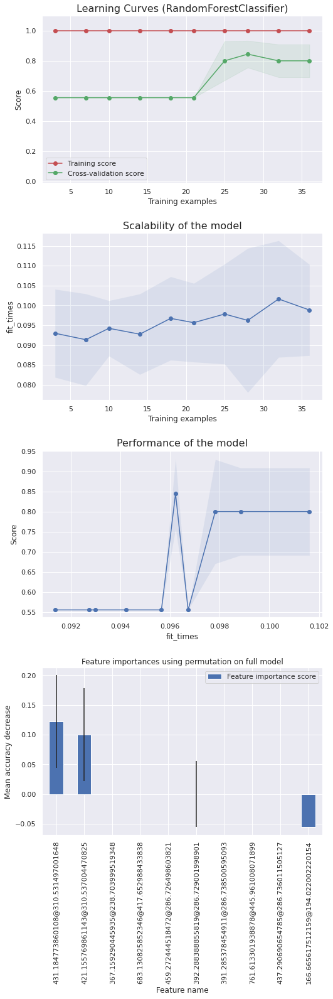




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


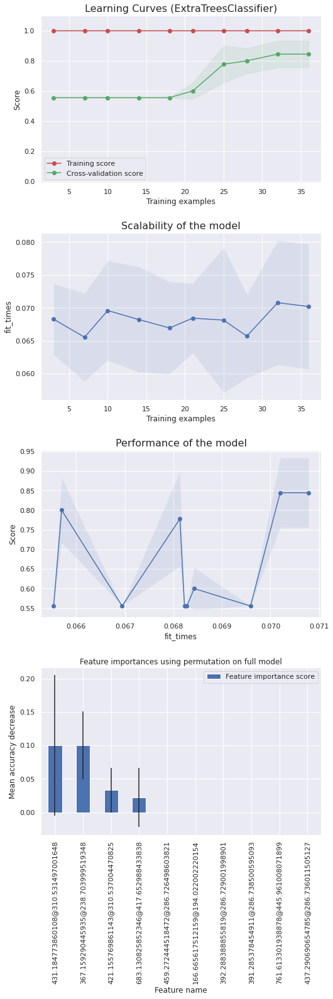




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.83,1.00,0.91,5.00
HCC,1.00,0.75,0.86,4.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.92,0.88,0.88,9.00
weighted avg,0.91,0.89,0.89,9.00


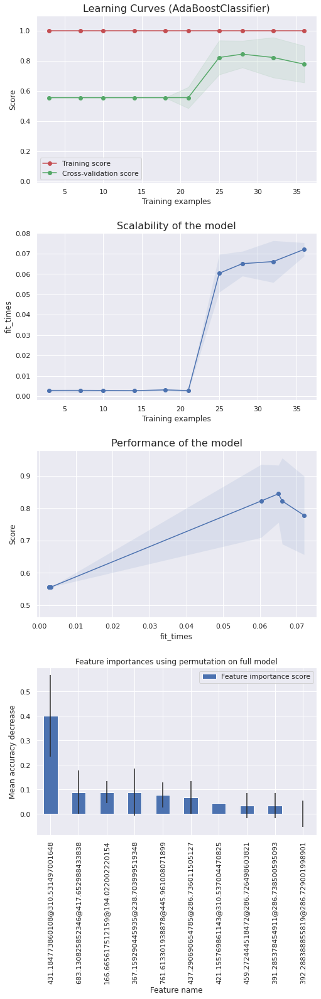




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


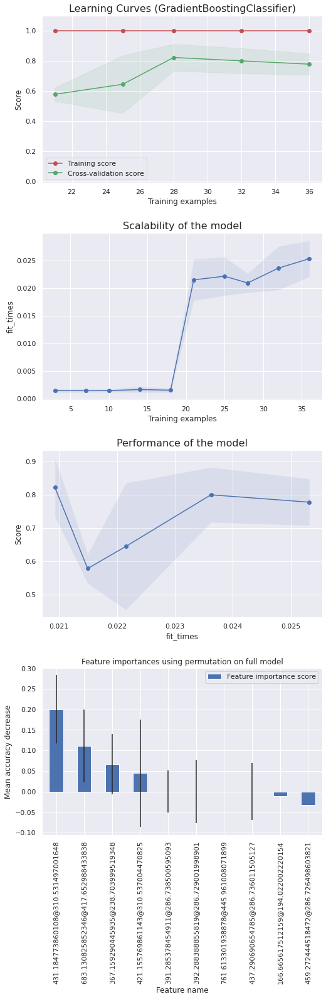




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,5,0
HCC,4,0



Classification report :


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
CRR,0.56,1.00,0.71,5.00
HCC,0.00,0.00,0.00,4.00
accuracy,0.56,0.56,0.56,0.56
macro avg,0.28,0.50,0.36,9.00
weighted avg,0.31,0.56,0.40,9.00


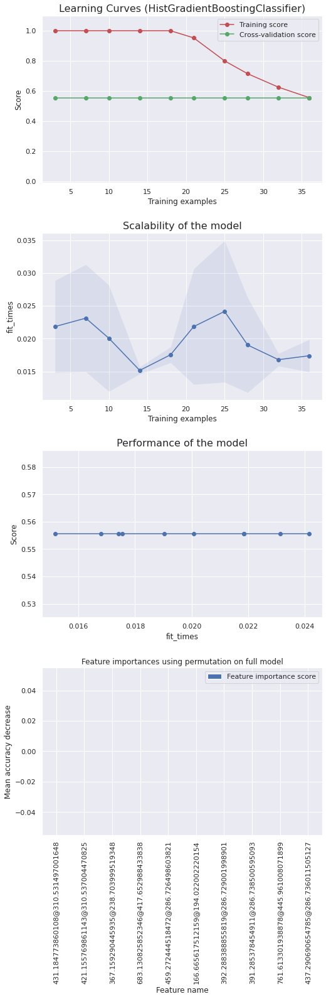




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,4,1
HCC,1,3



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.80,0.80,5.00
HCC,0.75,0.75,0.75,4.00
accuracy,0.78,0.78,0.78,0.78
macro avg,0.78,0.78,0.78,9.00
weighted avg,0.78,0.78,0.78,9.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


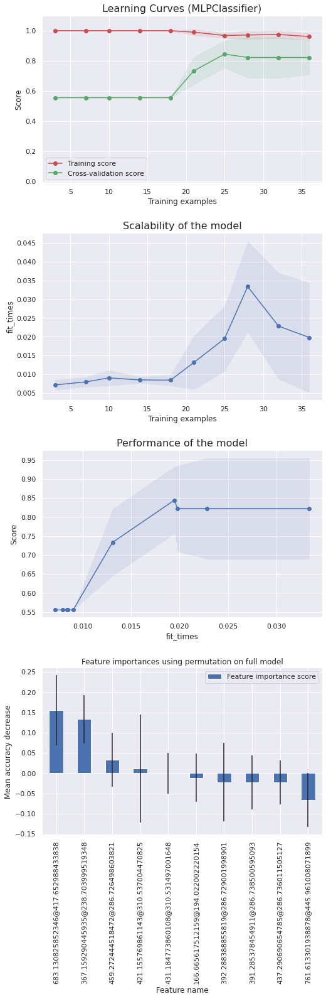




###################################################################################################################################################### 



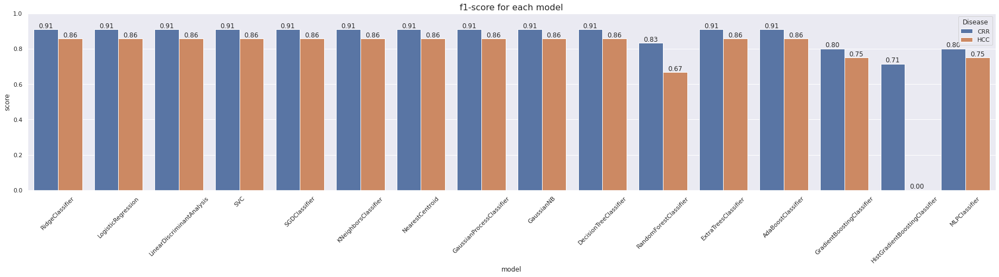


 ######################################################################################################################################################

Time to compute : 00h00m23s

 ######################################################################################################################################################






In [59]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=5, train_size=0.7, test_size=0.3)

In [60]:
print()

### with <code>X_imp_halfmin_std_fs_nb_5</code>

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



###################################################################################################################################################### 



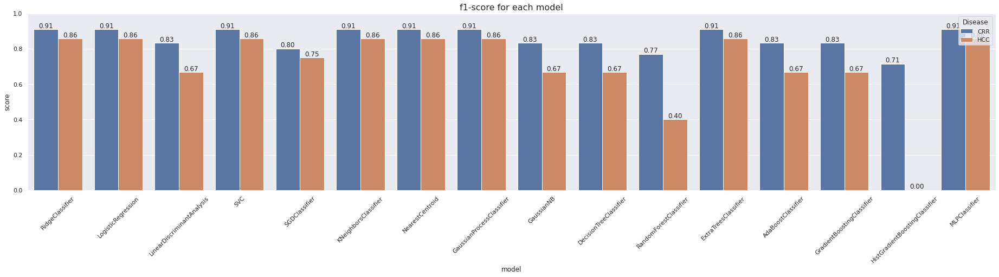


 ######################################################################################################################################################

Time to compute : 00h00m03s

 ######################################################################################################################################################






In [61]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_imp_halfmin_std_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=False, plot_hist_score=True,
                                                                score='f1-score', cv=10, train_size=0.7, test_size=0.3)

In [62]:
print()

### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [63]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
CRR,0.91,0.91,0.83,0.91,0.80,0.91,0.91,0.91,0.83,0.83,0.77,0.91,0.83,0.83,0.71,0.91
HCC,0.86,0.86,0.67,0.86,0.75,0.86,0.86,0.86,0.67,0.67,0.40,0.86,0.67,0.67,0.00,0.86


In [64]:
dict_df_feature_importance['DecisionTreeClassifier']

,Feature name,Feature importance score
0,431.184773860108@310.531497001648,0.21
3,683.130825852346@417.652988433838,0.06
2,367.159290445935@238.703999519348,0.03
4,459.272444518472@286.726498603821,0.00
1,421.155769861143@310.537004470825,-0.12


In [65]:
print()

### We can check in metadata if these features are identified

# 7 - Clustering

In [68]:
from clustering_functions import *

In [69]:
# target = 

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



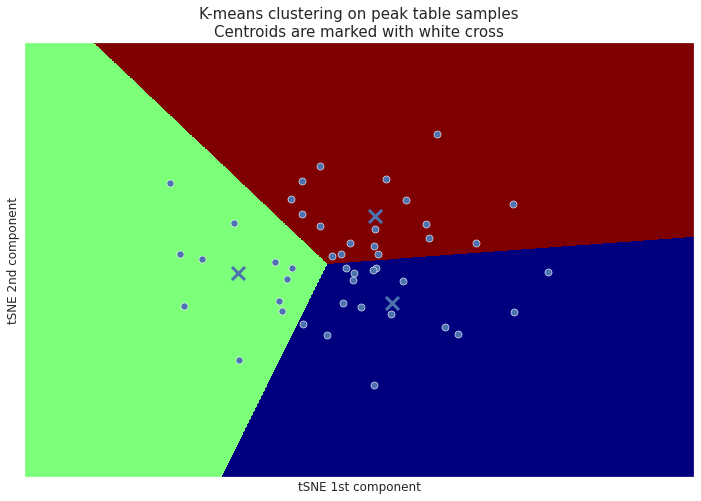

Inertia of k-means model : 14.38


In [70]:
kmeans = perform_kmeans(X_imp_halfmin_std_PCA_tSNE.astype('double'), n_clusters=3, col_prefix='tSNE')

## b - Affinity propagation

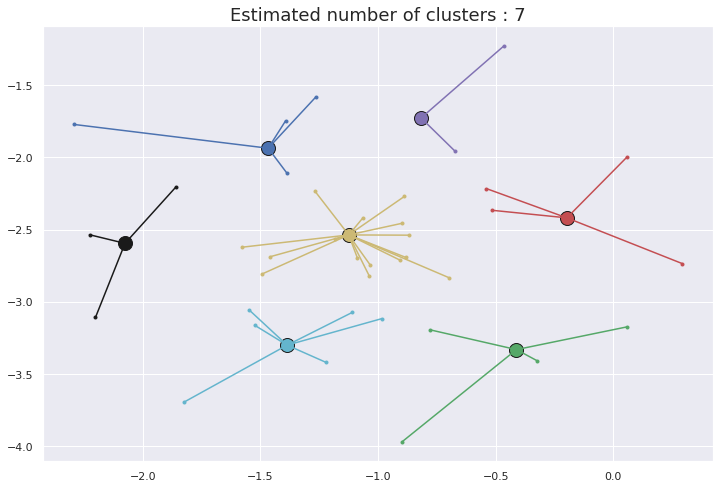

In [71]:
af = perform_affinity_propagation(X_imp_halfmin_std_PCA_tSNE)

## c - Hierarchical clustering

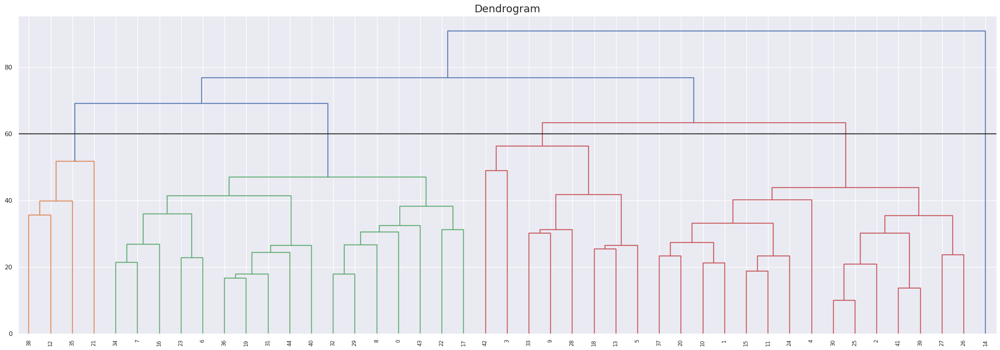

In [72]:
plot_dendrogram(X_imp_halfmin_std_PCA, hline=60)

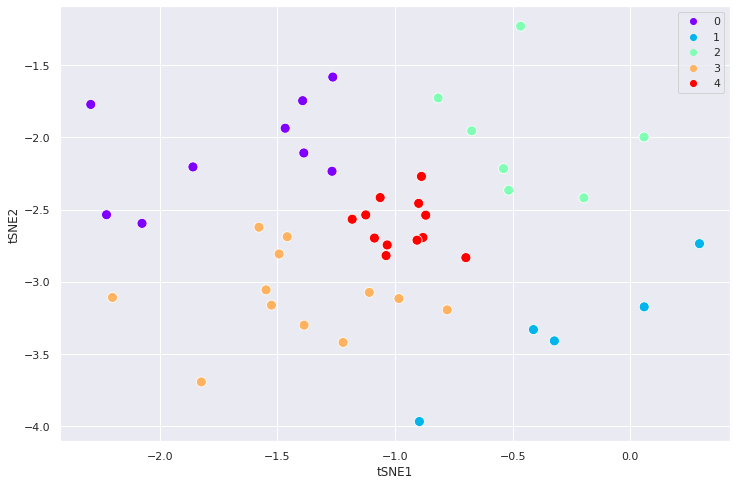

In [73]:
hc = perform_hierarchical_clustering(X_imp_halfmin_std_PCA_tSNE, n_clusters=5)